# Generative Adversarial Networks (GANs)
So far in CS231N, all the applications of neural networks that we have explored have been **discriminative models** that take an input and are trained to produce a labeled output. This has ranged from straightforward classification of image categories to sentence generation (which was still phrased as a classification problem, our labels were in vocabulary space and we’d learned a recurrence to capture multi-word labels). In this notebook, we will expand our repetoire, and build **generative models** using neural networks. Specifically, we will learn how to build models which generate novel images that resemble a set of training images.

### What is a GAN?

In 2014, [Goodfellow et al.](https://arxiv.org/abs/1406.2661) presented a method for training generative models called Generative Adversarial Networks (GANs for short). In a GAN, we build two different neural networks. Our first network is a traditional classification network, called the **discriminator**. We will train the discriminator to take images, and classify them as being real (belonging to the training set) or fake (not present in the training set). Our other network, called the **generator**, will take random noise as input and transform it using a neural network to produce images. The goal of the generator is to fool the discriminator into thinking the images it produced are real.

We can think of this back and forth process of the generator ($G$) trying to fool the discriminator ($D$), and the discriminator trying to correctly classify real vs. fake as a minimax game:
$$\underset{G}{\text{minimize}}\; \underset{D}{\text{maximize}}\; \mathbb{E}_{x \sim p_\text{data}}\left[\log D(x)\right] + \mathbb{E}_{z \sim p(z)}\left[\log \left(1-D(G(z))\right)\right]$$
where $x \sim p_\text{data}$ are samples from the input data, $z \sim p(z)$ are the random noise samples, $G(z)$ are the generated images using the neural network generator $G$, and $D$ is the output of the discriminator, specifying the probability of an input being real. In [Goodfellow et al.](https://arxiv.org/abs/1406.2661), they analyze this minimax game and show how it relates to minimizing the Jensen-Shannon divergence between the training data distribution and the generated samples from $G$.

To optimize this minimax game, we will aternate between taking gradient *descent* steps on the objective for $G$, and gradient *ascent* steps on the objective for $D$:
1. update the **generator** ($G$) to minimize the probability of the __discriminator making the correct choice__. 
2. update the **discriminator** ($D$) to maximize the probability of the __discriminator making the correct choice__.

While these updates are useful for analysis, they do not perform well in practice. Instead, we will use a different objective when we update the generator: maximize the probability of the **discriminator making the incorrect choice**. This small change helps to allevaiate problems with the generator gradient vanishing when the discriminator is confident. This is the standard update used in most GAN papers, and was used in the original paper from [Goodfellow et al.](https://arxiv.org/abs/1406.2661). 

In this assignment, we will alternate the following updates:
1. Update the generator ($G$) to maximize the probability of the discriminator making the incorrect choice on generated data:
$$\underset{G}{\text{maximize}}\;  \mathbb{E}_{z \sim p(z)}\left[\log D(G(z))\right]$$
2. Update the discriminator ($D$), to maximize the probability of the discriminator making the correct choice on real and generated data:
$$\underset{D}{\text{maximize}}\; \mathbb{E}_{x \sim p_\text{data}}\left[\log D(x)\right] + \mathbb{E}_{z \sim p(z)}\left[\log \left(1-D(G(z))\right)\right]$$

### What else is there?
Since 2014, GANs have exploded into a huge research area, with massive [workshops](https://sites.google.com/site/nips2016adversarial/), and [hundreds of new papers](https://github.com/hindupuravinash/the-gan-zoo). Compared to other approaches for generative models, they often produce the highest quality samples but are some of the most difficult and finicky models to train (see [this github repo](https://github.com/soumith/ganhacks) that contains a set of 17 hacks that are useful for getting models working). Improving the stabiilty and robustness of GAN training is an open research question, with new papers coming out every day! For a more recent tutorial on GANs, see [here](https://arxiv.org/abs/1701.00160). There is also some even more recent exciting work that changes the objective function to Wasserstein distance and yields much more stable results across model architectures: [WGAN](https://arxiv.org/abs/1701.07875), [WGAN-GP](https://arxiv.org/abs/1704.00028).


GANs are not the only way to train a generative model! For other approaches to generative modeling check out the [deep generative model chapter](http://www.deeplearningbook.org/contents/generative_models.html) of the Deep Learning [book](http://www.deeplearningbook.org). Another popular way of training neural networks as generative models is Variational Autoencoders (co-discovered [here](https://arxiv.org/abs/1312.6114) and [here](https://arxiv.org/abs/1401.4082)). Variational autoencoders combine neural networks with variational inference to train deep generative models. These models tend to be far more stable and easier to train but currently don't produce samples that are as pretty as GANs.

Example pictures of what you should expect (yours might look slightly different):

![caption](gan_outputs_tf.png)


## Setup

In [1]:
import tensorflow as tf
import numpy as np
import os

import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec

%matplotlib inline
plt.rcParams['figure.figsize'] = (10.0, 8.0) # set default size of plots
plt.rcParams['image.interpolation'] = 'nearest'
plt.rcParams['image.cmap'] = 'gray'

# A bunch of utility functions

def show_images(images):
    images = np.reshape(images, [images.shape[0], -1])  # images reshape to (batch_size, D)
    sqrtn = int(np.ceil(np.sqrt(images.shape[0])))
    sqrtimg = int(np.ceil(np.sqrt(images.shape[1])))

    fig = plt.figure(figsize=(sqrtn, sqrtn))
    gs = gridspec.GridSpec(sqrtn, sqrtn)
    gs.update(wspace=0.05, hspace=0.05)

    for i, img in enumerate(images):
        ax = plt.subplot(gs[i])
        plt.axis('off')
        ax.set_xticklabels([])
        ax.set_yticklabels([])
        ax.set_aspect('equal')
        plt.imshow(img.reshape([sqrtimg,sqrtimg]))
    return

def preprocess_img(x):
    return 2 * x - 1.0

def deprocess_img(x):
    return (x + 1.0) / 2.0

def rel_error(x,y):
    return np.max(np.abs(x - y) / (np.maximum(1e-8, np.abs(x) + np.abs(y))))

def count_params(model):
    """Count the number of parameters in the current TensorFlow graph """
    param_count = np.sum([np.prod(p.shape) for p in model.weights])
    return param_count

answers = np.load('gan-checks-tf.npz')

NOISE_DIM = 96

## Dataset
 GANs are notoriously finicky with hyperparameters, and also require many training epochs. In order to make this assignment approachable without a GPU, we will be working on the MNIST dataset, which is 60,000 training and 10,000 test images. Each picture contains a centered image of white digit on black background (0 through 9). This was one of the first datasets used to train convolutional neural networks and it is fairly easy -- a standard CNN model can easily exceed 99% accuracy. 
 

**Heads-up**: Our MNIST wrapper returns images as vectors. That is, they're size (batch, 784). If you want to treat them as images, we have to resize them to (batch,28,28) or (batch,28,28,1). They are also type np.float32 and bounded [0,1]. 

In [2]:
class MNIST(object):
    def __init__(self, batch_size, shuffle=False):
        """
        Construct an iterator object over the MNIST data
        
        Inputs:
        - batch_size: Integer giving number of elements per minibatch
        - shuffle: (optional) Boolean, whether to shuffle the data on each epoch
        """
        train, _ = tf.keras.datasets.mnist.load_data()
        X, y = train
        X = X.astype(np.float32)/255
        X = X.reshape((X.shape[0], -1))
        self.X, self.y = X, y
        self.batch_size, self.shuffle = batch_size, shuffle

    def __iter__(self):
        N, B = self.X.shape[0], self.batch_size
        idxs = np.arange(N)
        if self.shuffle:
            np.random.shuffle(idxs)
        return iter((self.X[i:i+B], self.y[i:i+B]) for i in range(0, N, B)) 

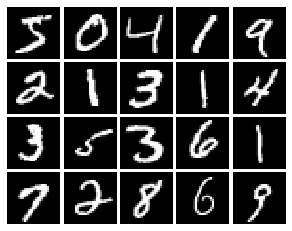

In [3]:
# show a batch
mnist = MNIST(batch_size=16) 
show_images(mnist.X[:20])

## LeakyReLU
In the cell below, you should implement a LeakyReLU. See the [class notes](http://cs231n.github.io/neural-networks-1/) (where alpha is small number) or equation (3) in [this paper](http://ai.stanford.edu/~amaas/papers/relu_hybrid_icml2013_final.pdf). LeakyReLUs keep ReLU units from dying and are often used in GAN methods (as are maxout units, however those increase model size and therefore are not used in this notebook).

HINT: You should be able to use `tf.maximum`

In [4]:
def leaky_relu(x, alpha=0.01):
    """Compute the leaky ReLU activation function.
    
    Inputs:
    - x: TensorFlow Tensor with arbitrary shape
    - alpha: leak parameter for leaky ReLU
    
    Returns:
    TensorFlow Tensor with the same shape as x
    """
    # TODO: implement leaky ReLU
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    return tf.maximum(alpha * x, x)

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****


Test your leaky ReLU implementation. You should get errors < 1e-10

In [5]:
def test_leaky_relu(x, y_true):
    y = leaky_relu(tf.constant(x))
    print('Maximum error: %g'%rel_error(y_true, y))

test_leaky_relu(answers['lrelu_x'], answers['lrelu_y'])

Maximum error: 0


## Random Noise
Generate a TensorFlow `Tensor` containing uniform noise from -1 to 1 with shape `[batch_size, dim]`.

In [6]:
def sample_noise(batch_size, dim):
    """Generate random uniform noise from -1 to 1.
    
    Inputs:
    - batch_size: integer giving the batch size of noise to generate
    - dim: integer giving the dimension of the noise to generate
    
    Returns:
    TensorFlow Tensor containing uniform noise in [-1, 1] with shape [batch_size, dim]
    """
    # TODO: sample and return noise
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return tf.random.uniform([batch_size, dim], minval=-1,maxval=1)
    

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****


Make sure noise is the correct shape and type:

In [7]:
def test_sample_noise():
    batch_size = 3
    dim = 4
    z = sample_noise(batch_size, dim)
    # Check z has the correct shape
    assert z.get_shape().as_list() == [batch_size, dim]
    # Make sure z is a Tensor and not a numpy array
    assert isinstance(z, tf.Tensor)
    # Check that we get different noise for different evaluations
    z1 = sample_noise(batch_size, dim)
    z2 = sample_noise(batch_size, dim)
    assert not np.array_equal(z1, z2)
    # Check that we get the correct range
    assert np.all(z1 >= -1.0) and np.all(z1 <= 1.0)
    print("All tests passed!")
    
test_sample_noise()

All tests passed!


## Discriminator
Our first step is to build a discriminator. **Hint:** You should use the layers in `tf.keras.layers` to build the model.
All fully connected layers should include bias terms. For initialization, just use the default initializer used by the `tf.keras.layers` functions.

Architecture:
 * Fully connected layer with input size 784 and output size 256
 * LeakyReLU with alpha 0.01
 * Fully connected layer with output size 256
 * LeakyReLU with alpha 0.01
 * Fully connected layer with output size 1 
 
The output of the discriminator should thus have shape `[batch_size, 1]`, and contain real numbers corresponding to the scores that each of the `batch_size` inputs is a real image.

In [8]:
from tensorflow.keras.layers import Dense, LeakyReLU, ReLU, Activation


def discriminator():
    """Compute discriminator score for a batch of input images.
    
    Inputs:
    - x: TensorFlow Tensor of flattened input images, shape [batch_size, 784]
    
    Returns:
    TensorFlow Tensor with shape [batch_size, 1], containing the score 
    for an image being real for each input image.
    """
    model = tf.keras.models.Sequential([
        # TODO: implement architecture
        # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
        
        Dense(256, input_shape=(784,)),
        LeakyReLU(alpha=0.01),
        Dense(256),
        LeakyReLU(alpha=0.01),
        Dense(1) 
              ])

        # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    
    return model

Test to make sure the number of parameters in the discriminator is correct:

In [9]:
def test_discriminator(true_count=267009):
    model = discriminator()
    cur_count = count_params(model)
    if cur_count != true_count:
        print('Incorrect number of parameters in discriminator. {0} instead of {1}. Check your achitecture.'.format(cur_count,true_count))
    else:
        print('Correct number of parameters in discriminator.')
        
test_discriminator()

Correct number of parameters in discriminator.


## Generator
Now to build a generator. You should use the layers in `tf.keras.layers` to construct the model. All fully connected layers should include bias terms. Note that you can use the tf.nn module to access activation functions. Once again, use the default initializers for parameters.

Architecture:
 * Fully connected layer with inupt size tf.shape(z)[1] (the number of noise dimensions) and output size 1024
 * `ReLU`
 * Fully connected layer with output size 1024 
 * `ReLU`
 * Fully connected layer with output size 784
 * `TanH` (To restrict every element of the output to be in the range [-1,1])

In [10]:
def generator(noise_dim=NOISE_DIM):
    """Generate images from a random noise vector.
    
    Inputs:
    - z: TensorFlow Tensor of random noise with shape [batch_size, noise_dim]
    
    Returns:
    TensorFlow Tensor of generated images, with shape [batch_size, 784].
    """
    model = tf.keras.models.Sequential([
        # TODO: implement architecture
        # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
        Dense(1024, input_shape=(noise_dim,)),
        ReLU(),
        Dense(1024),
        ReLU(),
        Dense(784),      
        Activation('tanh')
        

        # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    ])
    return model

Test to make sure the number of parameters in the generator is correct:

In [11]:
def test_generator(true_count=1858320):
    model = generator(4)
    cur_count = count_params(model)
    if cur_count != true_count:
        print('Incorrect number of parameters in generator. {0} instead of {1}. Check your achitecture.'.format(cur_count,true_count))
    else:
        print('Correct number of parameters in generator.')
        
test_generator()

Correct number of parameters in generator.


# GAN Loss

Compute the generator and discriminator loss. The generator loss is:
$$\ell_G  =  -\mathbb{E}_{z \sim p(z)}\left[\log D(G(z))\right]$$
and the discriminator loss is:
$$ \ell_D = -\mathbb{E}_{x \sim p_\text{data}}\left[\log D(x)\right] - \mathbb{E}_{z \sim p(z)}\left[\log \left(1-D(G(z))\right)\right]$$
Note that these are negated from the equations presented earlier as we will be *minimizing* these losses.

**HINTS**: Use [tf.ones](https://www.tensorflow.org/versions/r2.0/api_docs/python/tf/ones) and [tf.zeros](https://www.tensorflow.org/versions/r2.0/api_docs/python/tf/zeros) to generate labels for your discriminator. Use [tf.keras.losses.BinaryCrossentropy](https://www.tensorflow.org/versions/r2.0/api_docs/python/tf/losses/BinaryCrossentropy) to help compute your loss function.

In [12]:
def discriminator_loss(logits_real, logits_fake):
    """
    Computes the discriminator loss described above.
    
    Inputs:
    - logits_real: Tensor of shape (N, 1) giving scores for the real data.
    - logits_fake: Tensor of shape (N, 1) giving scores for the fake data.
    
    Returns:
    - loss: Tensor containing (scalar) the loss for the discriminator.
    """
    N,_ = logits_real.shape
    
    loss = None
    
    bce = tf.keras.losses.BinaryCrossentropy(from_logits=True)

    Dx = bce(tf.ones(logits_real.shape), logits_real)
    DGx = bce(tf.zeros(logits_fake.shape), logits_fake)
  
    
    loss =  Dx + DGx
  

    return loss
    

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

def generator_loss(logits_fake):
    """
    Computes the generator loss described above.

    Inputs:
    - logits_fake: PyTorch Tensor of shape (N,) giving scores for the fake data.
    
    Returns:
    - loss: PyTorch Tensor containing the (scalar) loss for the generator.
    """
    
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    bce = tf.keras.losses.BinaryCrossentropy(from_logits=True)
    
    loss = bce(tf.ones(logits_fake.shape), logits_fake)

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return loss

Test your GAN loss. Make sure both the generator and discriminator loss are correct. You should see errors less than 1e-8.

In [13]:
def test_discriminator_loss(logits_real, logits_fake, d_loss_true):
    d_loss = discriminator_loss(tf.constant(logits_real),
                                tf.constant(logits_fake))
    print("Maximum error in d_loss: %g"%rel_error(d_loss_true, d_loss))

test_discriminator_loss(answers['logits_real'], answers['logits_fake'],
                        answers['d_loss_true'])

W1004 07:53:43.658266 140736021201792 deprecation.py:323] From /anaconda3/lib/python3.7/site-packages/tensorflow/python/ops/nn_impl.py:182: add_dispatch_support.<locals>.wrapper (from tensorflow.python.ops.array_ops) is deprecated and will be removed in a future version.
Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where


Maximum error in d_loss: 3.97058e-09


In [14]:
def test_generator_loss(logits_fake, g_loss_true):
    g_loss = generator_loss(tf.constant(logits_fake))
    print("Maximum error in g_loss: %g"%rel_error(g_loss_true, g_loss))

test_generator_loss(answers['logits_fake'], answers['g_loss_true'])

Maximum error in g_loss: 4.4518e-09


# Optimizing our loss
Make an `Adam` optimizer with a 1e-3 learning rate, beta1=0.5 to mininize G_loss and D_loss separately. The trick of decreasing beta was shown to be effective in helping GANs converge in the [Improved Techniques for Training GANs](https://arxiv.org/abs/1606.03498) paper. In fact, with our current hyperparameters, if you set beta1 to the Tensorflow default of 0.9, there's a good chance your discriminator loss will go to zero and the generator will fail to learn entirely. In fact, this is a common failure mode in GANs; if your D(x) learns too fast (e.g. loss goes near zero), your G(z) is never able to learn. Often D(x) is trained with SGD with Momentum or RMSProp instead of Adam, but here we'll use Adam for both D(x) and G(z). 

In [15]:
# TODO: create an AdamOptimizer for D_solver and G_solver
def get_solvers(learning_rate=1e-3, beta1=0.5):
    """Create solvers for GAN training.
    
    Inputs:
    - learning_rate: learning rate to use for both solvers
    - beta1: beta1 parameter for both solvers (first moment decay)
    
    Returns:
    - D_solver: instance of tf.optimizers.Adam with correct learning_rate and beta1
    - G_solver: instance of tf.optimizers.Adam with correct learning_rate and beta1
    """
    D_solver = None
    G_solver = None
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    D_solver = tf.optimizers.Adam(learning_rate=learning_rate, beta_1=beta1)
    G_solver = tf.optimizers.Adam(learning_rate=learning_rate, beta_1=beta1)

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return D_solver, G_solver

# Training a GAN!
Well that wasn't so hard, was it? After the first epoch, you should see fuzzy outlines, clear shapes as you approach epoch 3, and decent shapes, about half of which will be sharp and clearly recognizable as we pass epoch 5. In our case, we'll simply train D(x) and G(z) with one batch each every iteration. However, papers often experiment with different schedules of training D(x) and G(z), sometimes doing one for more steps than the other, or even training each one until the loss gets "good enough" and then switching to training the other. 

In [16]:
# a giant helper function
def run_a_gan(D, G, D_solver, G_solver, discriminator_loss, generator_loss,\
              show_every=20, print_every=20, batch_size=128, num_epochs=10, noise_size=96):
    """Train a GAN for a certain number of epochs.
    
    Inputs:
    - D: Discriminator model
    - G: Generator model
    - D_solver: an Optimizer for Discriminator
    - G_solver: an Optimizer for Generator
    - generator_loss: Generator loss
    - discriminator_loss: Discriminator loss
    Returns:
        Nothing
    """
    mnist = MNIST(batch_size=batch_size, shuffle=True)
    
    iter_count = 0
    for epoch in range(num_epochs):
        for (x, _) in mnist:
            with tf.GradientTape() as tape:
                real_data = x
                logits_real = D(preprocess_img(real_data))

                g_fake_seed = sample_noise(batch_size, noise_size)
                fake_images = G(g_fake_seed)
                
                a = tf.reshape(fake_images, [batch_size, 784])
                
                
                logits_fake = D(tf.reshape(fake_images, [batch_size, 784]))

                d_total_error = discriminator_loss(logits_real, logits_fake)
                d_gradients = tape.gradient(d_total_error, D.trainable_variables)      
                D_solver.apply_gradients(zip(d_gradients, D.trainable_variables))
            
            with tf.GradientTape() as tape:
                g_fake_seed = sample_noise(batch_size, noise_size)
                fake_images = G(g_fake_seed)

                gen_logits_fake = D(tf.reshape(fake_images, [batch_size, 784]))
                g_error = generator_loss(gen_logits_fake)
                g_gradients = tape.gradient(g_error, G.trainable_variables)      
                G_solver.apply_gradients(zip(g_gradients, G.trainable_variables))

            if (iter_count % show_every == 0):
                print('Epoch: {}, Iter: {}, D: {:.4}, G:{:.4}'.format(epoch, iter_count,d_total_error,g_error))
                imgs_numpy = fake_images.cpu().numpy()
                show_images(imgs_numpy[0:16])
                plt.show()
            iter_count += 1
    
    # random noise fed into our generator
    z = sample_noise(batch_size, noise_size)
    # generated images
    G_sample = G(z)
    print('Final images')
    show_images(G_sample[:16])
    plt.show()

#### Train your GAN! This should take about 10 minutes on a CPU, or about 2 minutes on GPU.

Epoch: 0, Iter: 0, D: 1.085, G:0.7121


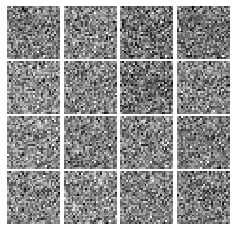

Epoch: 0, Iter: 20, D: 0.5629, G:1.004


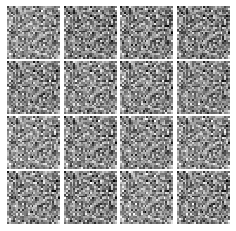

Epoch: 0, Iter: 40, D: 0.447, G:1.287


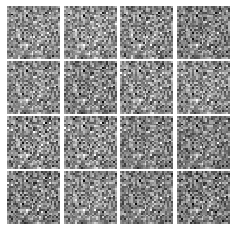

Epoch: 0, Iter: 60, D: 2.552, G:1.942


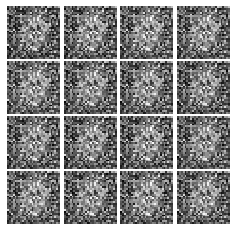

Epoch: 0, Iter: 80, D: 1.154, G:1.077


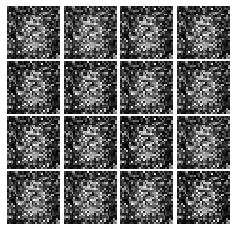

Epoch: 0, Iter: 100, D: 0.9479, G:2.221


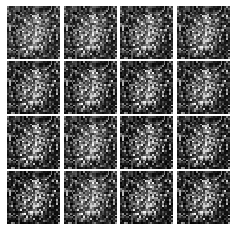

Epoch: 0, Iter: 120, D: 1.539, G:0.9403


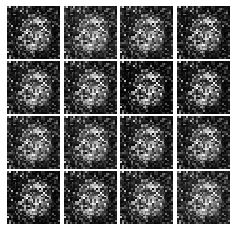

Epoch: 0, Iter: 140, D: 1.473, G:1.034


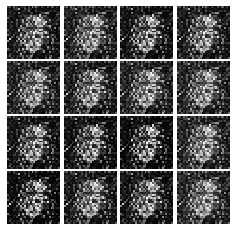

Epoch: 0, Iter: 160, D: 1.448, G:1.01


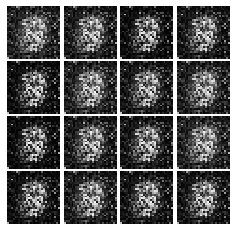

Epoch: 0, Iter: 180, D: 1.592, G:0.8795


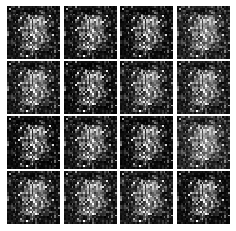

Epoch: 0, Iter: 200, D: 1.274, G:1.28


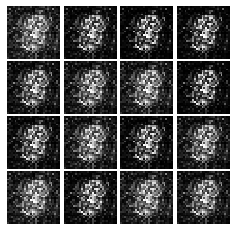

Epoch: 0, Iter: 220, D: 1.104, G:1.302


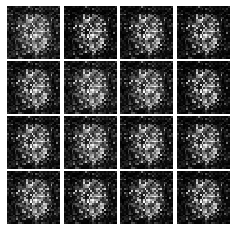

Epoch: 0, Iter: 240, D: 1.068, G:1.316


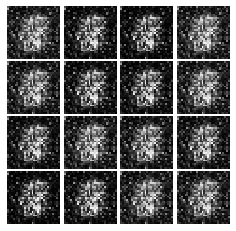

Epoch: 0, Iter: 260, D: 1.476, G:0.5682


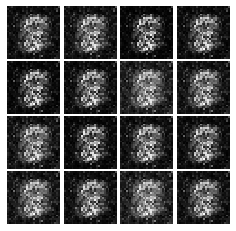

Epoch: 0, Iter: 280, D: 0.9173, G:1.205


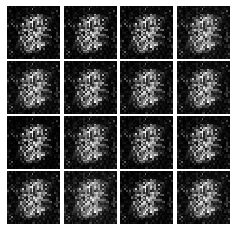

Epoch: 0, Iter: 300, D: 1.913, G:0.8985


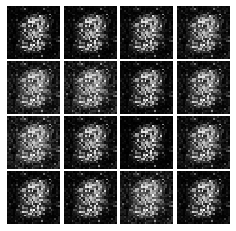

Epoch: 0, Iter: 320, D: 1.403, G:0.9732


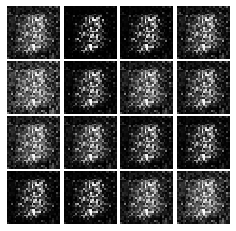

Epoch: 0, Iter: 340, D: 1.049, G:1.729


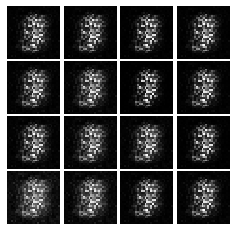

Epoch: 0, Iter: 360, D: 0.6814, G:1.736


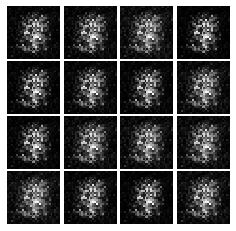

Epoch: 0, Iter: 380, D: 1.319, G:1.241


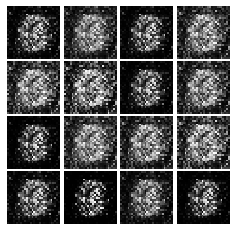

Epoch: 0, Iter: 400, D: 1.288, G:1.277


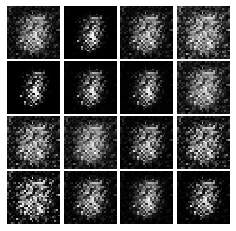

Epoch: 0, Iter: 420, D: 1.221, G:0.763


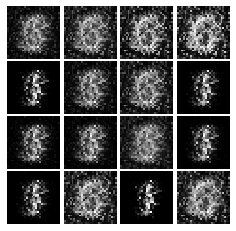

Epoch: 0, Iter: 440, D: 1.24, G:0.59


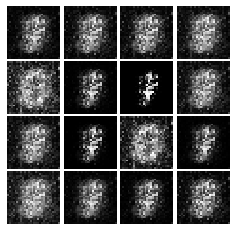

Epoch: 0, Iter: 460, D: 1.075, G:1.381


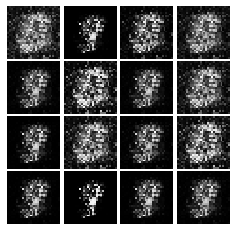

Epoch: 1, Iter: 480, D: 1.164, G:1.211


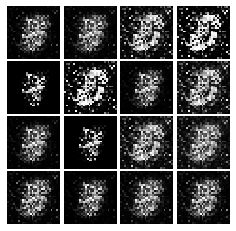

Epoch: 1, Iter: 500, D: 0.7878, G:1.64


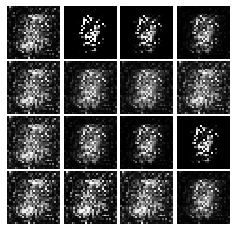

Epoch: 1, Iter: 520, D: 1.427, G:3.599


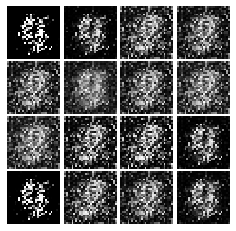

Epoch: 1, Iter: 540, D: 0.81, G:2.063


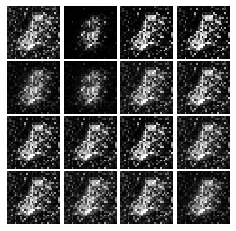

Epoch: 1, Iter: 560, D: 1.064, G:1.665


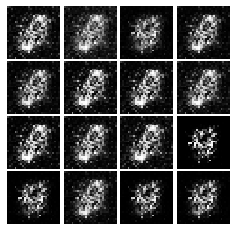

Epoch: 1, Iter: 580, D: 2.472, G:4.064


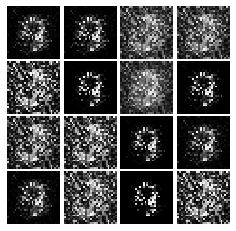

Epoch: 1, Iter: 600, D: 1.07, G:2.667


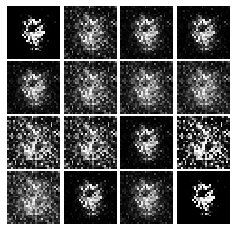

Epoch: 1, Iter: 620, D: 0.9333, G:1.561


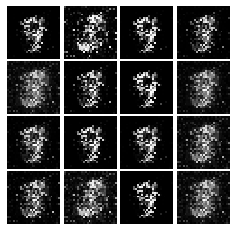

Epoch: 1, Iter: 640, D: 1.289, G:1.584


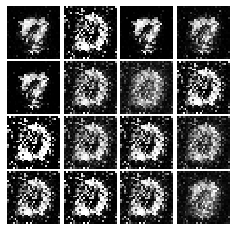

Epoch: 1, Iter: 660, D: 1.186, G:1.403


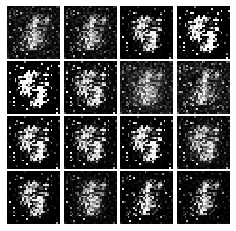

Epoch: 1, Iter: 680, D: 1.453, G:1.277


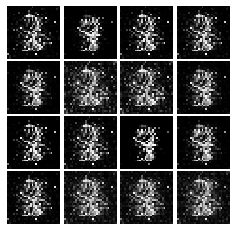

Epoch: 1, Iter: 700, D: 2.18, G:0.2249


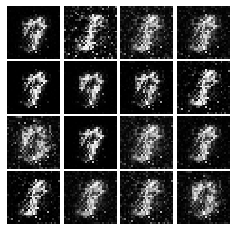

Epoch: 1, Iter: 720, D: 1.086, G:1.23


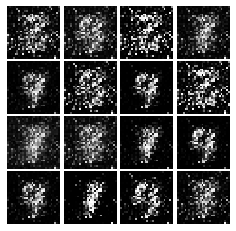

Epoch: 1, Iter: 740, D: 1.097, G:1.621


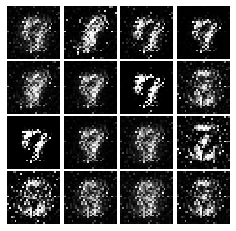

Epoch: 1, Iter: 760, D: 1.332, G:1.052


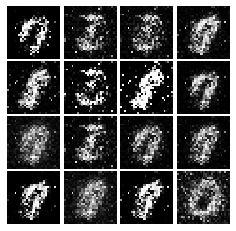

Epoch: 1, Iter: 780, D: 1.12, G:1.506


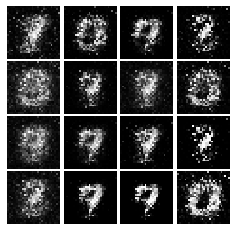

Epoch: 1, Iter: 800, D: 0.7174, G:1.627


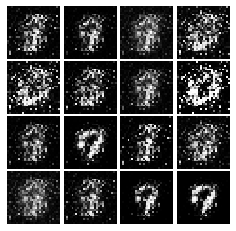

Epoch: 1, Iter: 820, D: 1.829, G:2.664


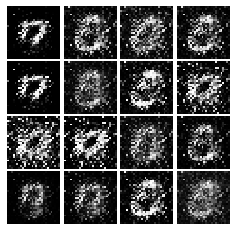

Epoch: 1, Iter: 840, D: 1.141, G:1.031


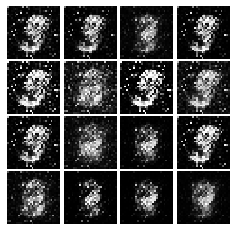

Epoch: 1, Iter: 860, D: 1.119, G:1.898


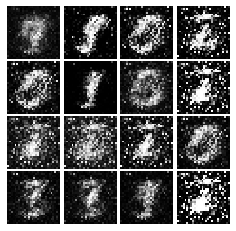

Epoch: 1, Iter: 880, D: 1.22, G:1.803


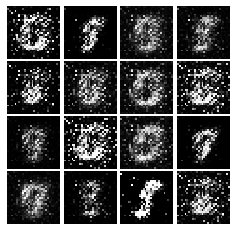

Epoch: 1, Iter: 900, D: 1.086, G:1.134


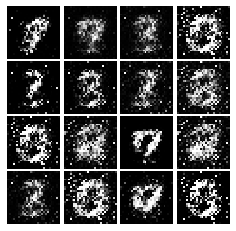

Epoch: 1, Iter: 920, D: 1.218, G:1.355


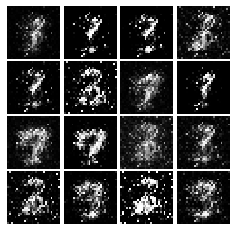

Epoch: 2, Iter: 940, D: 1.143, G:1.813


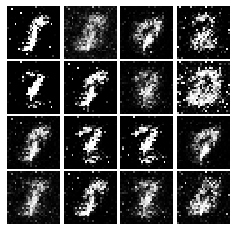

Epoch: 2, Iter: 960, D: 1.458, G:0.9918


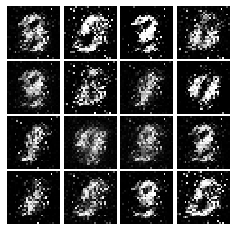

Epoch: 2, Iter: 980, D: 0.991, G:1.235


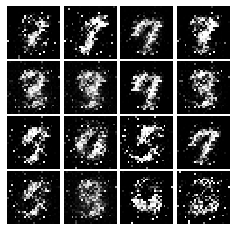

Epoch: 2, Iter: 1000, D: 0.9896, G:1.473


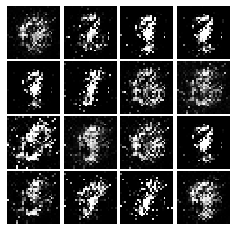

Epoch: 2, Iter: 1020, D: 1.037, G:2.15


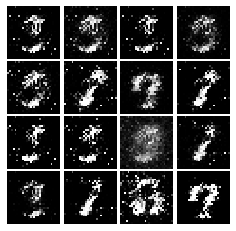

Epoch: 2, Iter: 1040, D: 1.453, G:0.5699


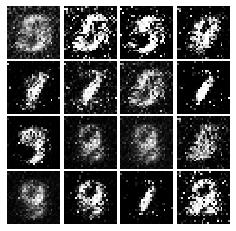

Epoch: 2, Iter: 1060, D: 1.207, G:1.751


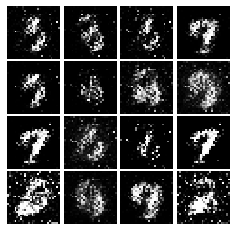

Epoch: 2, Iter: 1080, D: 1.113, G:1.001


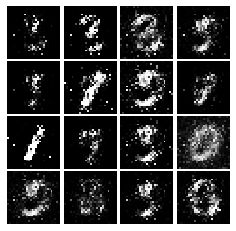

Epoch: 2, Iter: 1100, D: 1.137, G:1.146


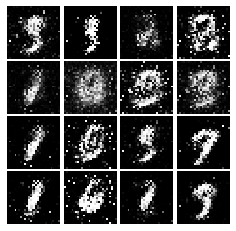

Epoch: 2, Iter: 1120, D: 1.252, G:2.237


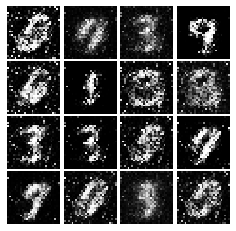

Epoch: 2, Iter: 1140, D: 1.865, G:1.377


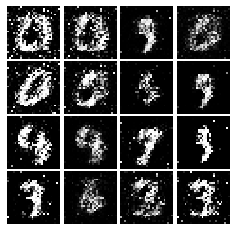

Epoch: 2, Iter: 1160, D: 1.161, G:1.2


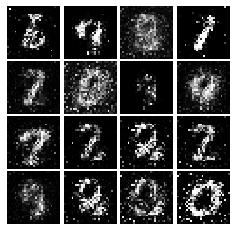

Epoch: 2, Iter: 1180, D: 1.252, G:0.9062


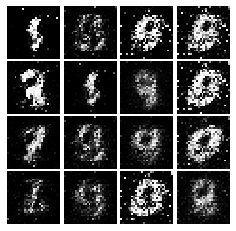

Epoch: 2, Iter: 1200, D: 1.223, G:0.9871


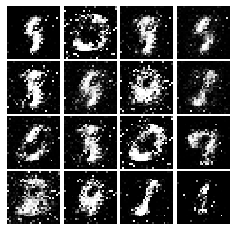

Epoch: 2, Iter: 1220, D: 1.267, G:0.9804


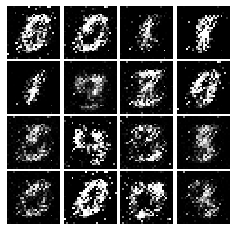

Epoch: 2, Iter: 1240, D: 1.22, G:1.034


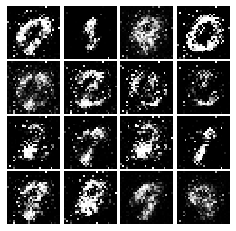

Epoch: 2, Iter: 1260, D: 1.154, G:1.603


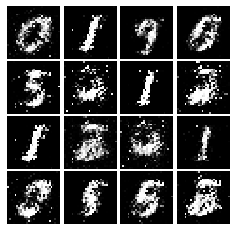

Epoch: 2, Iter: 1280, D: 1.01, G:1.388


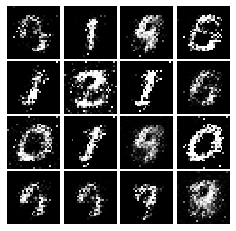

Epoch: 2, Iter: 1300, D: 1.274, G:1.097


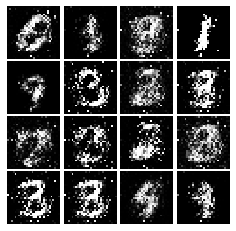

Epoch: 2, Iter: 1320, D: 1.191, G:1.042


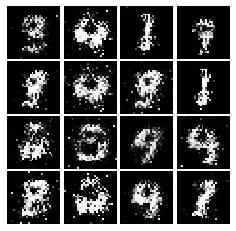

Epoch: 2, Iter: 1340, D: 1.209, G:1.225


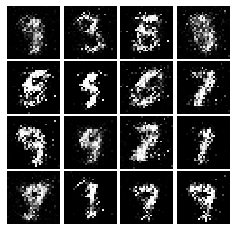

Epoch: 2, Iter: 1360, D: 1.603, G:1.151


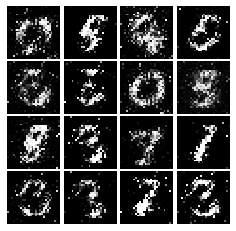

Epoch: 2, Iter: 1380, D: 1.176, G:1.397


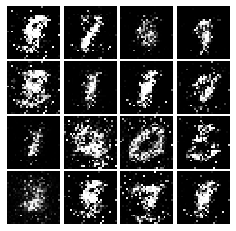

Epoch: 2, Iter: 1400, D: 1.081, G:1.125


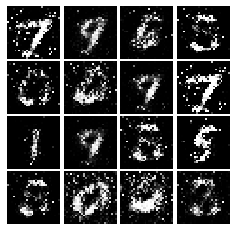

Epoch: 3, Iter: 1420, D: 1.382, G:0.9985


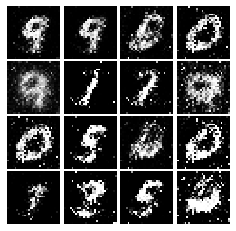

Epoch: 3, Iter: 1440, D: 1.249, G:0.9972


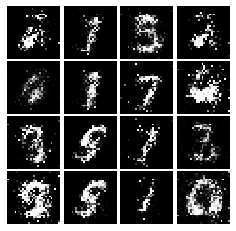

Epoch: 3, Iter: 1460, D: 1.235, G:0.8985


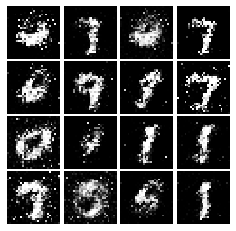

Epoch: 3, Iter: 1480, D: 1.256, G:1.056


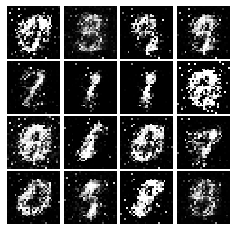

Epoch: 3, Iter: 1500, D: 1.29, G:0.8839


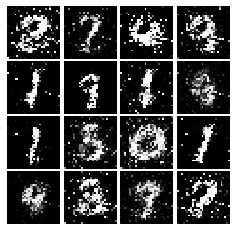

Epoch: 3, Iter: 1520, D: 1.395, G:0.929


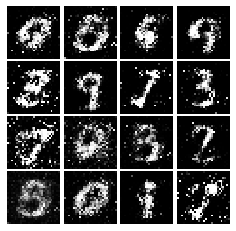

Epoch: 3, Iter: 1540, D: 1.139, G:1.107


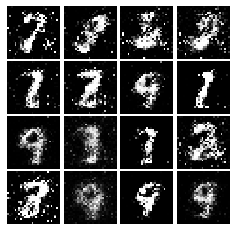

Epoch: 3, Iter: 1560, D: 1.275, G:0.8987


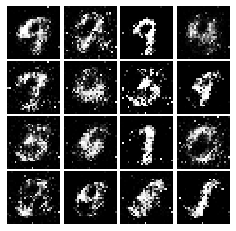

Epoch: 3, Iter: 1580, D: 1.176, G:0.889


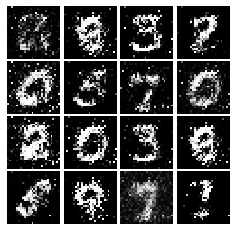

Epoch: 3, Iter: 1600, D: 1.301, G:1.086


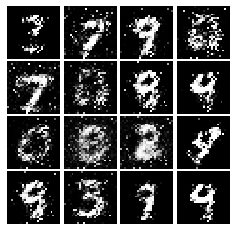

Epoch: 3, Iter: 1620, D: 1.298, G:0.8436


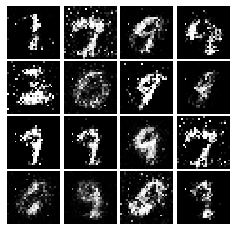

Epoch: 3, Iter: 1640, D: 1.146, G:1.385


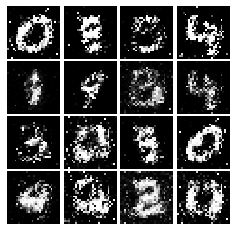

Epoch: 3, Iter: 1660, D: 1.187, G:1.122


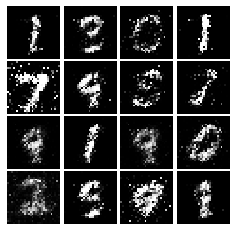

Epoch: 3, Iter: 1680, D: 1.398, G:0.8636


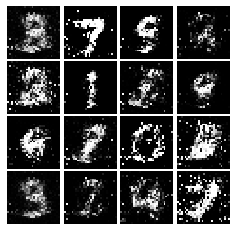

Epoch: 3, Iter: 1700, D: 1.228, G:1.788


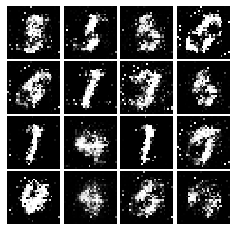

Epoch: 3, Iter: 1720, D: 1.226, G:1.071


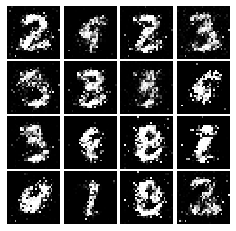

Epoch: 3, Iter: 1740, D: 1.236, G:0.9121


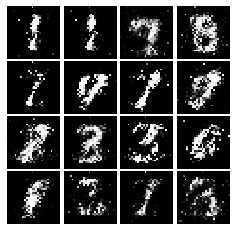

Epoch: 3, Iter: 1760, D: 1.521, G:0.2734


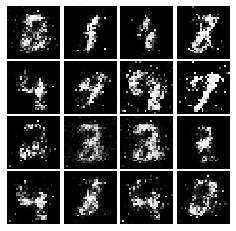

Epoch: 3, Iter: 1780, D: 1.226, G:0.9952


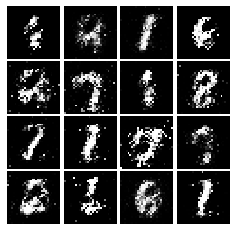

Epoch: 3, Iter: 1800, D: 1.222, G:0.9425


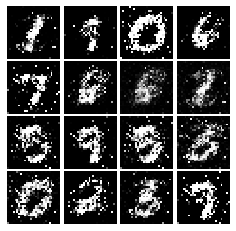

Epoch: 3, Iter: 1820, D: 1.192, G:0.9701


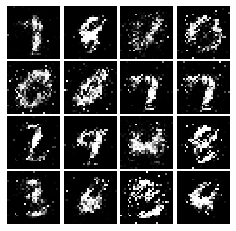

Epoch: 3, Iter: 1840, D: 1.255, G:0.9393


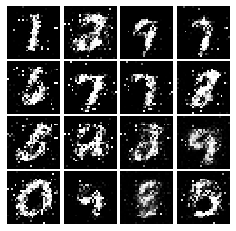

Epoch: 3, Iter: 1860, D: 1.32, G:0.9552


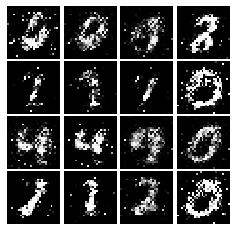

Epoch: 4, Iter: 1880, D: 1.285, G:1.079


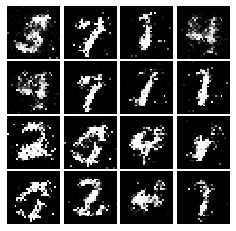

Epoch: 4, Iter: 1900, D: 1.305, G:1.527


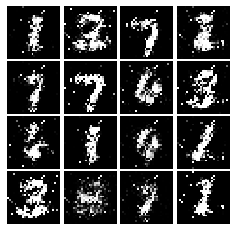

Epoch: 4, Iter: 1920, D: 1.181, G:1.019


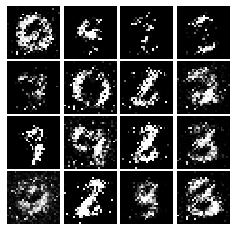

Epoch: 4, Iter: 1940, D: 1.221, G:1.044


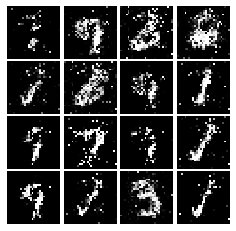

Epoch: 4, Iter: 1960, D: 1.182, G:1.247


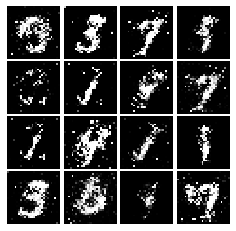

Epoch: 4, Iter: 1980, D: 1.249, G:0.814


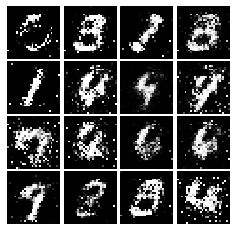

Epoch: 4, Iter: 2000, D: 1.382, G:1.516


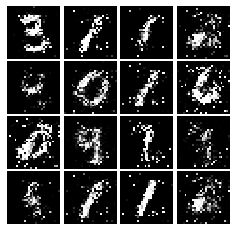

Epoch: 4, Iter: 2020, D: 1.194, G:1.012


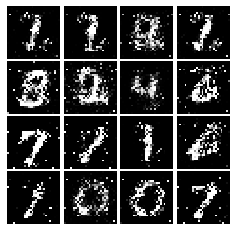

Epoch: 4, Iter: 2040, D: 1.347, G:0.9244


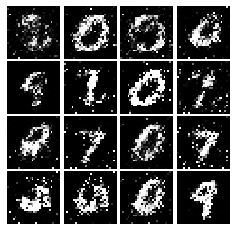

Epoch: 4, Iter: 2060, D: 1.16, G:1.052


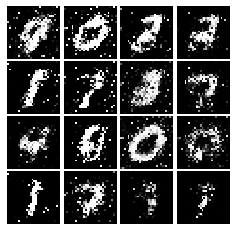

Epoch: 4, Iter: 2080, D: 1.211, G:0.9843


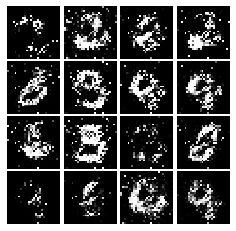

Epoch: 4, Iter: 2100, D: 1.352, G:0.9628


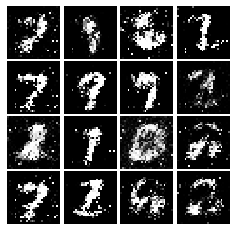

Epoch: 4, Iter: 2120, D: 1.222, G:0.9256


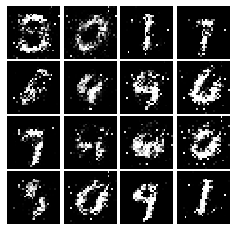

Epoch: 4, Iter: 2140, D: 1.33, G:0.898


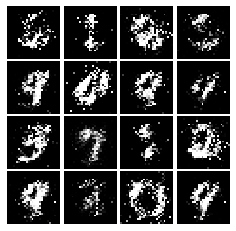

Epoch: 4, Iter: 2160, D: 1.308, G:0.8764


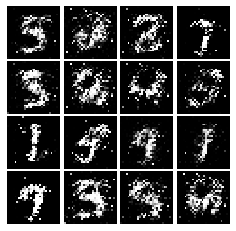

Epoch: 4, Iter: 2180, D: 1.289, G:0.8696


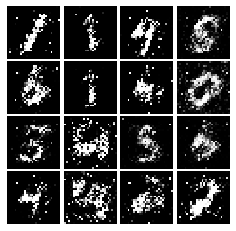

Epoch: 4, Iter: 2200, D: 1.234, G:0.9879


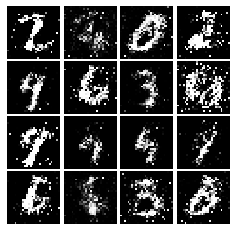

Epoch: 4, Iter: 2220, D: 1.245, G:1.137


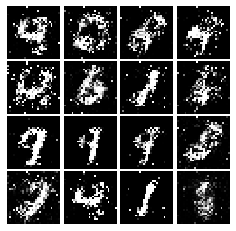

Epoch: 4, Iter: 2240, D: 1.066, G:1.792


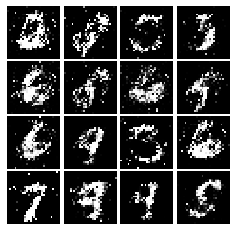

Epoch: 4, Iter: 2260, D: 1.21, G:0.8922


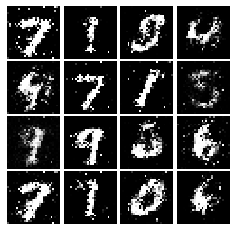

Epoch: 4, Iter: 2280, D: 1.277, G:0.8604


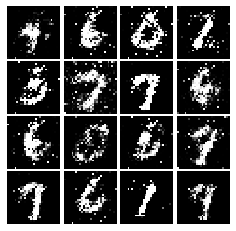

Epoch: 4, Iter: 2300, D: 1.286, G:0.9489


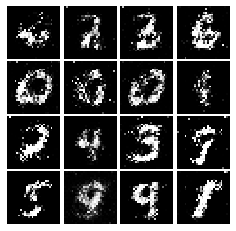

Epoch: 4, Iter: 2320, D: 1.282, G:1.075


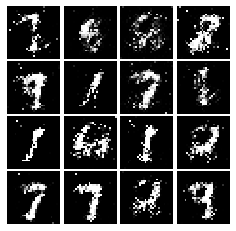

Epoch: 4, Iter: 2340, D: 1.312, G:0.3114


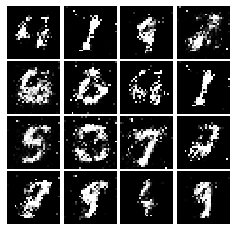

Epoch: 5, Iter: 2360, D: 1.244, G:0.9451


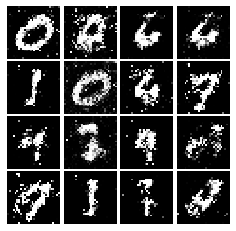

Epoch: 5, Iter: 2380, D: 1.233, G:0.84


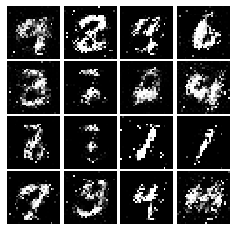

Epoch: 5, Iter: 2400, D: 1.319, G:0.9423


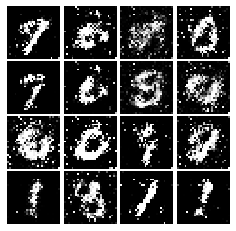

Epoch: 5, Iter: 2420, D: 1.201, G:1.009


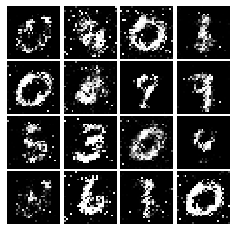

Epoch: 5, Iter: 2440, D: 1.131, G:1.011


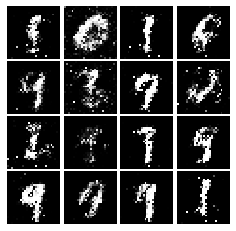

Epoch: 5, Iter: 2460, D: 1.092, G:1.035


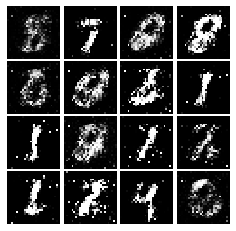

Epoch: 5, Iter: 2480, D: 1.22, G:0.8944


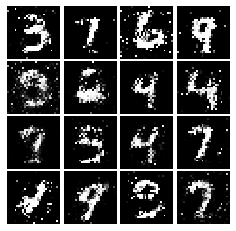

Epoch: 5, Iter: 2500, D: 1.182, G:0.9304


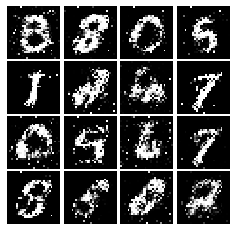

Epoch: 5, Iter: 2520, D: 1.532, G:0.9047


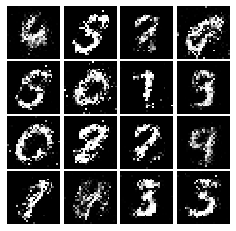

Epoch: 5, Iter: 2540, D: 1.189, G:0.8427


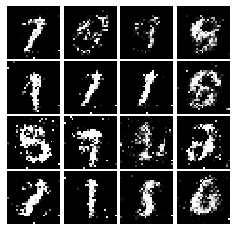

Epoch: 5, Iter: 2560, D: 1.281, G:0.8244


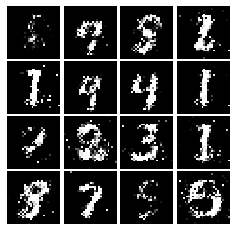

Epoch: 5, Iter: 2580, D: 1.282, G:1.157


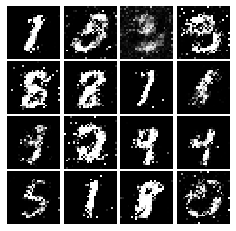

Epoch: 5, Iter: 2600, D: 1.45, G:0.7195


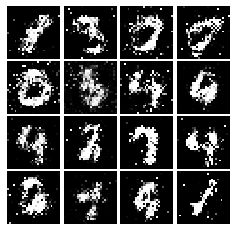

Epoch: 5, Iter: 2620, D: 1.324, G:0.7893


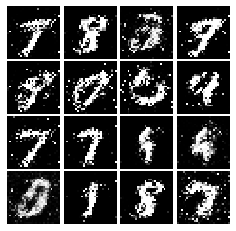

Epoch: 5, Iter: 2640, D: 1.324, G:1.026


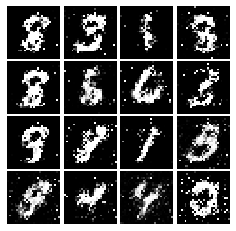

Epoch: 5, Iter: 2660, D: 1.208, G:0.9513


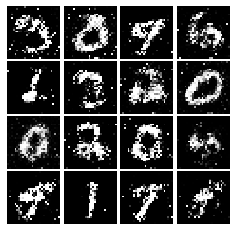

Epoch: 5, Iter: 2680, D: 1.324, G:0.8278


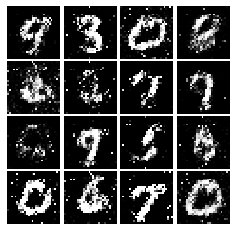

Epoch: 5, Iter: 2700, D: 1.389, G:0.8497


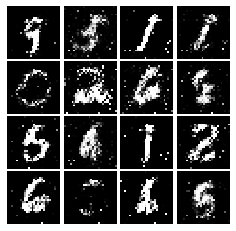

Epoch: 5, Iter: 2720, D: 1.366, G:1.008


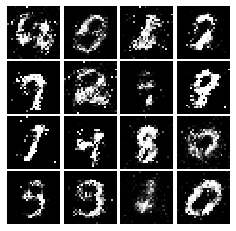

Epoch: 5, Iter: 2740, D: 1.221, G:0.9762


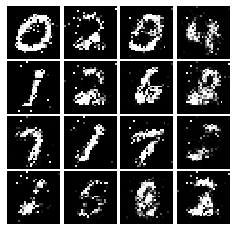

Epoch: 5, Iter: 2760, D: 1.342, G:0.9648


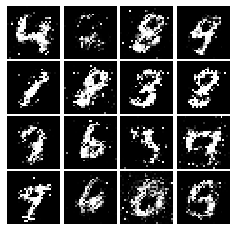

Epoch: 5, Iter: 2780, D: 1.322, G:0.7854


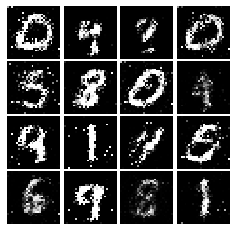

Epoch: 5, Iter: 2800, D: 1.407, G:0.9416


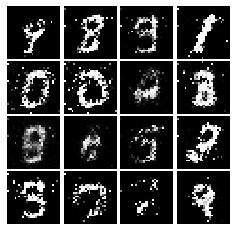

Epoch: 6, Iter: 2820, D: 1.372, G:0.8328


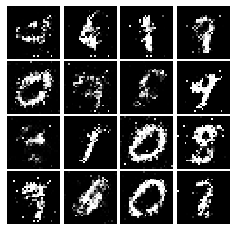

Epoch: 6, Iter: 2840, D: 1.316, G:0.8558


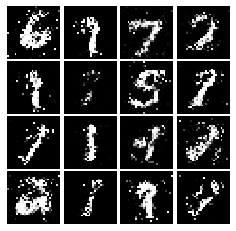

Epoch: 6, Iter: 2860, D: 1.33, G:1.144


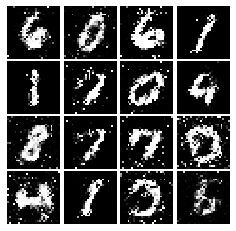

Epoch: 6, Iter: 2880, D: 1.252, G:1.169


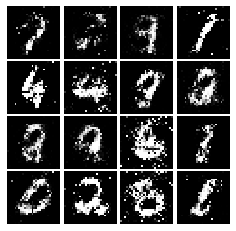

Epoch: 6, Iter: 2900, D: 1.374, G:0.8409


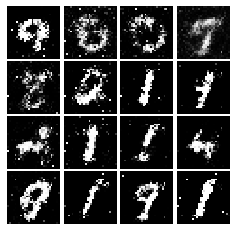

Epoch: 6, Iter: 2920, D: 1.31, G:0.7899


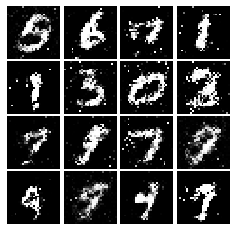

Epoch: 6, Iter: 2940, D: 1.299, G:0.7922


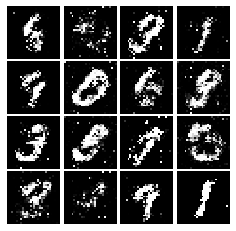

Epoch: 6, Iter: 2960, D: 1.373, G:0.8304


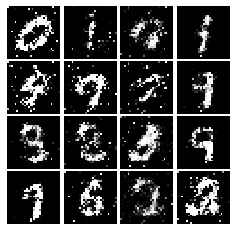

Epoch: 6, Iter: 2980, D: 1.41, G:0.865


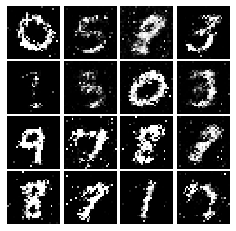

Epoch: 6, Iter: 3000, D: 1.327, G:0.8193


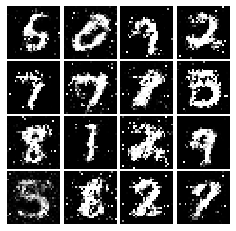

Epoch: 6, Iter: 3020, D: 1.364, G:0.9423


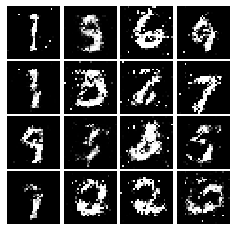

Epoch: 6, Iter: 3040, D: 1.339, G:0.8654


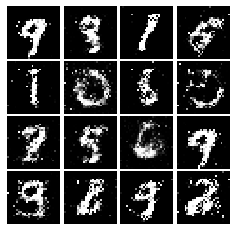

Epoch: 6, Iter: 3060, D: 1.344, G:0.8118


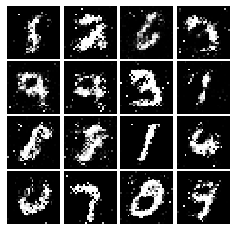

Epoch: 6, Iter: 3080, D: 1.347, G:0.8613


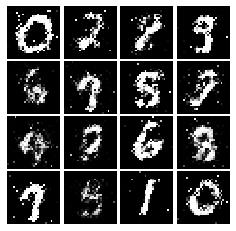

Epoch: 6, Iter: 3100, D: 1.325, G:0.8535


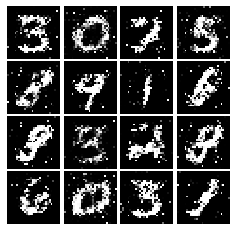

Epoch: 6, Iter: 3120, D: 1.281, G:0.8896


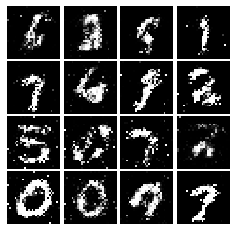

Epoch: 6, Iter: 3140, D: 1.391, G:0.8617


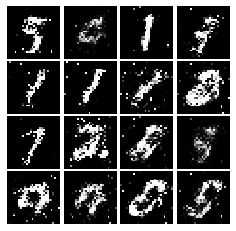

Epoch: 6, Iter: 3160, D: 1.211, G:0.9477


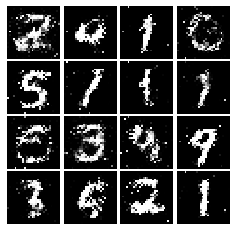

Epoch: 6, Iter: 3180, D: 1.259, G:0.8281


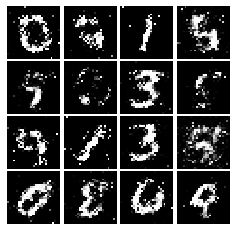

Epoch: 6, Iter: 3200, D: 1.313, G:0.6115


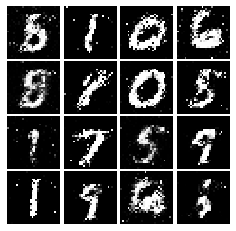

Epoch: 6, Iter: 3220, D: 1.304, G:0.8158


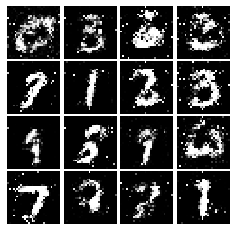

Epoch: 6, Iter: 3240, D: 1.337, G:0.7774


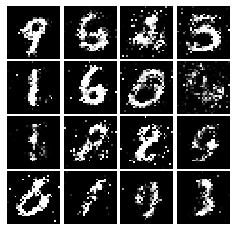

Epoch: 6, Iter: 3260, D: 1.405, G:0.9003


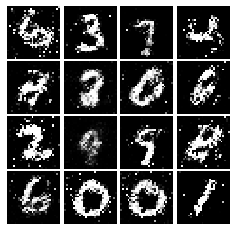

Epoch: 6, Iter: 3280, D: 1.227, G:0.7775


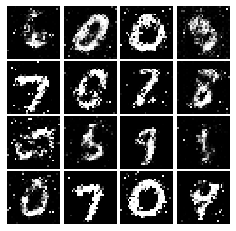

Epoch: 7, Iter: 3300, D: 1.298, G:0.9729


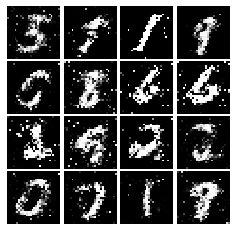

Epoch: 7, Iter: 3320, D: 1.291, G:0.8327


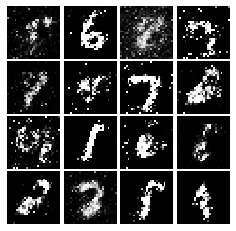

Epoch: 7, Iter: 3340, D: 1.187, G:1.082


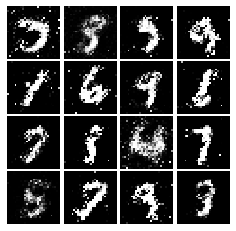

Epoch: 7, Iter: 3360, D: 1.303, G:0.8089


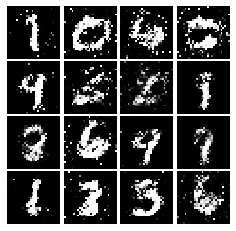

Epoch: 7, Iter: 3380, D: 1.336, G:0.9712


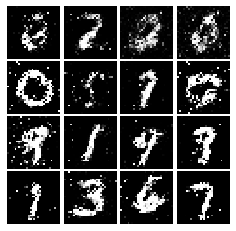

Epoch: 7, Iter: 3400, D: 1.395, G:0.8237


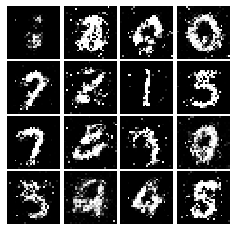

Epoch: 7, Iter: 3420, D: 1.317, G:0.8315


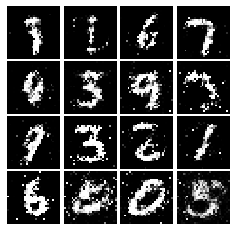

Epoch: 7, Iter: 3440, D: 1.389, G:0.8067


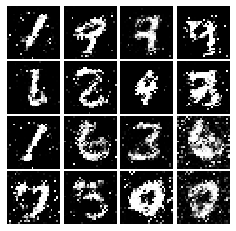

Epoch: 7, Iter: 3460, D: 1.206, G:0.8325


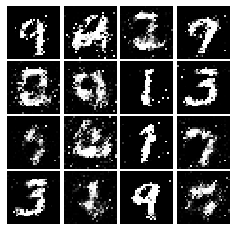

Epoch: 7, Iter: 3480, D: 1.321, G:0.7636


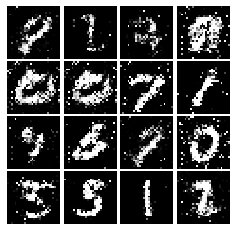

Epoch: 7, Iter: 3500, D: 1.373, G:1.184


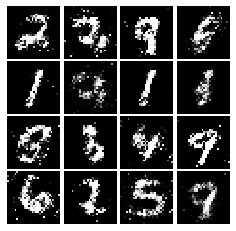

Epoch: 7, Iter: 3520, D: 1.392, G:0.753


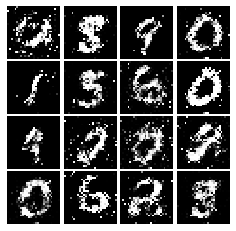

Epoch: 7, Iter: 3540, D: 1.359, G:0.7972


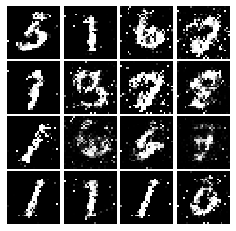

Epoch: 7, Iter: 3560, D: 1.34, G:0.7803


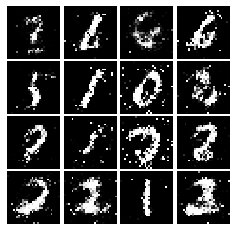

Epoch: 7, Iter: 3580, D: 1.292, G:0.7848


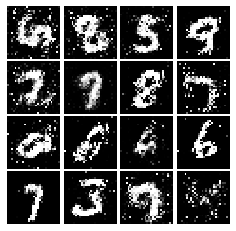

Epoch: 7, Iter: 3600, D: 1.312, G:0.7686


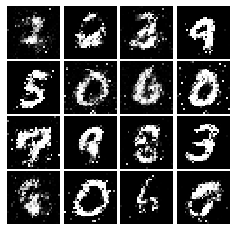

Epoch: 7, Iter: 3620, D: 1.362, G:0.7427


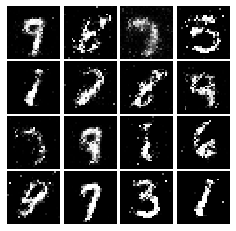

Epoch: 7, Iter: 3640, D: 1.372, G:0.7986


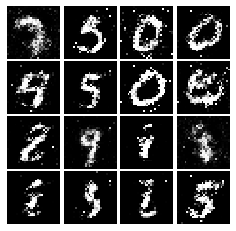

Epoch: 7, Iter: 3660, D: 1.301, G:0.8688


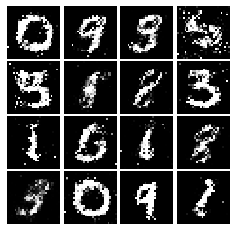

Epoch: 7, Iter: 3680, D: 1.275, G:0.8301


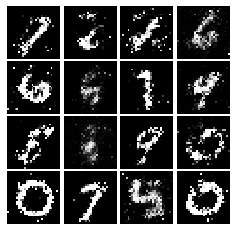

Epoch: 7, Iter: 3700, D: 1.38, G:0.7658


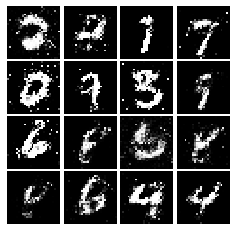

Epoch: 7, Iter: 3720, D: 1.289, G:0.8618


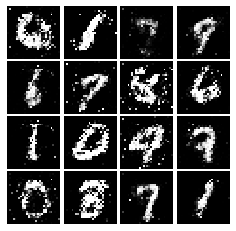

Epoch: 7, Iter: 3740, D: 1.305, G:0.7753


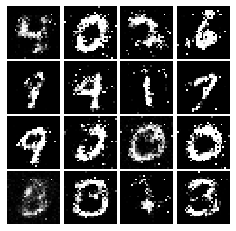

Epoch: 8, Iter: 3760, D: 1.413, G:0.8236


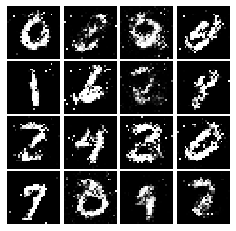

Epoch: 8, Iter: 3780, D: 1.359, G:0.804


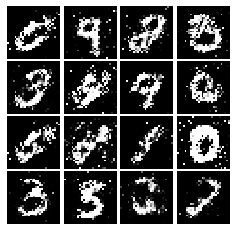

Epoch: 8, Iter: 3800, D: 1.316, G:0.8619


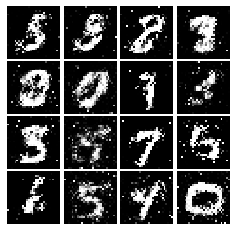

Epoch: 8, Iter: 3820, D: 1.303, G:0.8059


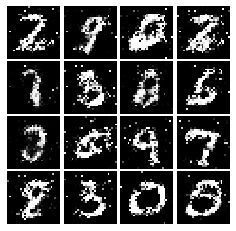

Epoch: 8, Iter: 3840, D: 1.348, G:0.7813


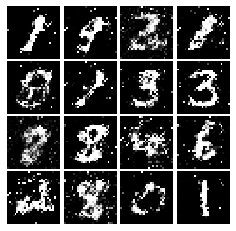

Epoch: 8, Iter: 3860, D: 1.333, G:0.813


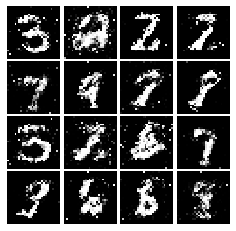

Epoch: 8, Iter: 3880, D: 1.338, G:0.6917


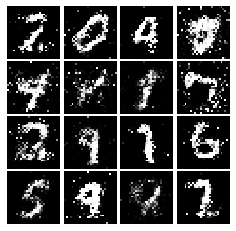

Epoch: 8, Iter: 3900, D: 1.341, G:0.9095


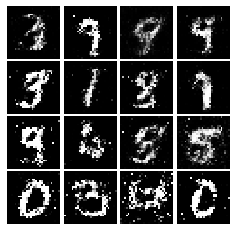

Epoch: 8, Iter: 3920, D: 1.304, G:0.8157


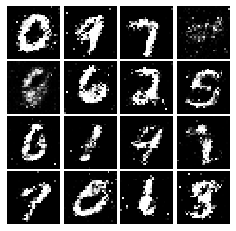

Epoch: 8, Iter: 3940, D: 1.4, G:0.7484


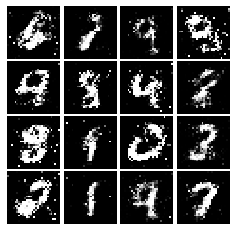

Epoch: 8, Iter: 3960, D: 1.379, G:0.7928


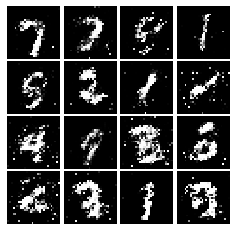

Epoch: 8, Iter: 3980, D: 1.376, G:0.775


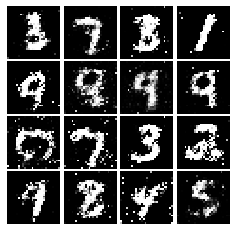

Epoch: 8, Iter: 4000, D: 1.323, G:0.8516


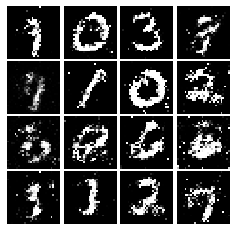

Epoch: 8, Iter: 4020, D: 1.41, G:0.8516


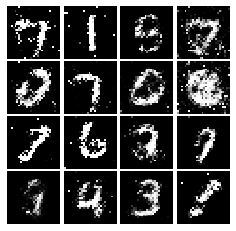

Epoch: 8, Iter: 4040, D: 1.292, G:0.8649


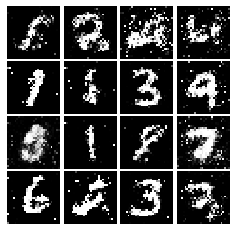

Epoch: 8, Iter: 4060, D: 1.35, G:0.7579


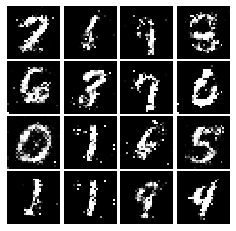

Epoch: 8, Iter: 4080, D: 1.382, G:0.6784


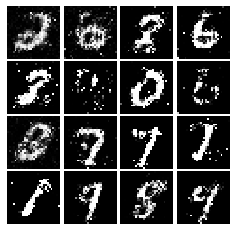

Epoch: 8, Iter: 4100, D: 1.442, G:0.8956


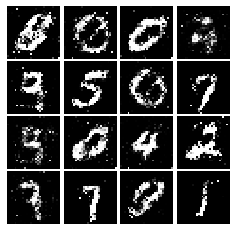

Epoch: 8, Iter: 4120, D: 1.346, G:0.7591


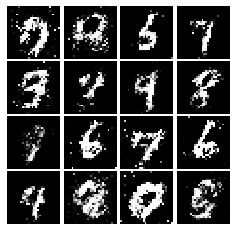

Epoch: 8, Iter: 4140, D: 1.392, G:0.794


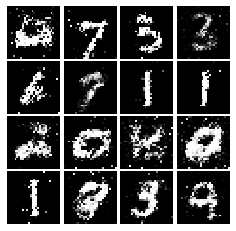

Epoch: 8, Iter: 4160, D: 1.349, G:0.8305


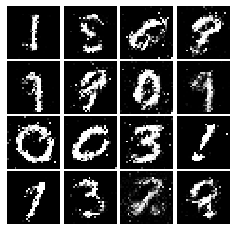

Epoch: 8, Iter: 4180, D: 1.289, G:0.775


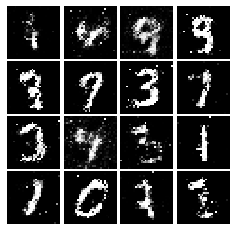

Epoch: 8, Iter: 4200, D: 1.343, G:0.8589


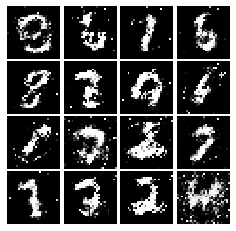

Epoch: 8, Iter: 4220, D: 1.417, G:0.8526


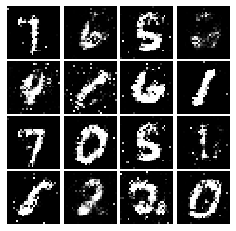

Epoch: 9, Iter: 4240, D: 1.393, G:0.6752


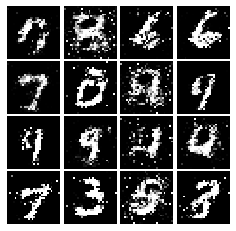

Epoch: 9, Iter: 4260, D: 1.399, G:0.8566


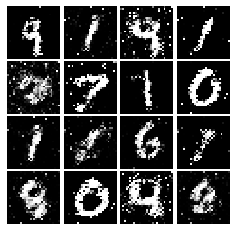

Epoch: 9, Iter: 4280, D: 1.389, G:0.859


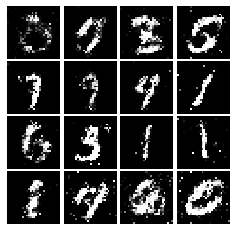

Epoch: 9, Iter: 4300, D: 1.338, G:0.9259


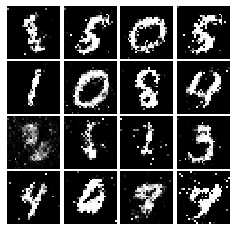

Epoch: 9, Iter: 4320, D: 1.324, G:0.7436


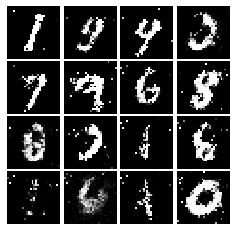

Epoch: 9, Iter: 4340, D: 1.31, G:0.8273


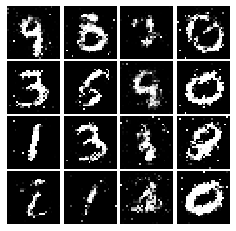

Epoch: 9, Iter: 4360, D: 1.371, G:0.8426


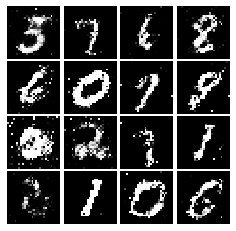

Epoch: 9, Iter: 4380, D: 1.399, G:0.7886


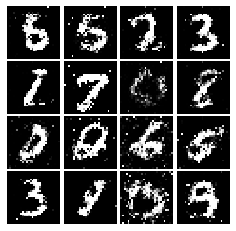

Epoch: 9, Iter: 4400, D: 1.274, G:0.9021


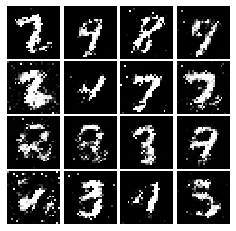

Epoch: 9, Iter: 4420, D: 1.308, G:0.8245


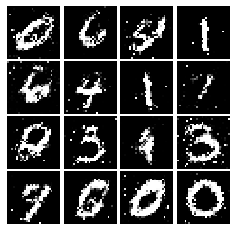

Epoch: 9, Iter: 4440, D: 1.357, G:0.7596


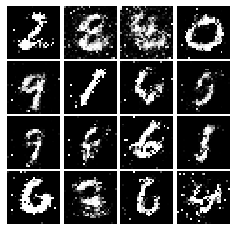

Epoch: 9, Iter: 4460, D: 1.342, G:0.818


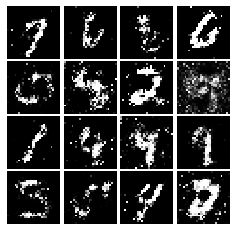

Epoch: 9, Iter: 4480, D: 1.344, G:0.7381


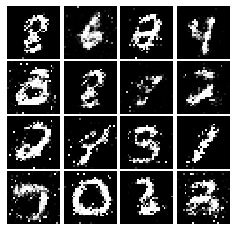

Epoch: 9, Iter: 4500, D: 1.4, G:0.7552


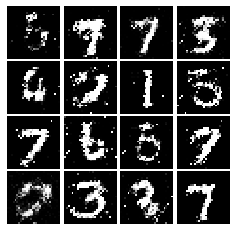

Epoch: 9, Iter: 4520, D: 1.34, G:0.8294


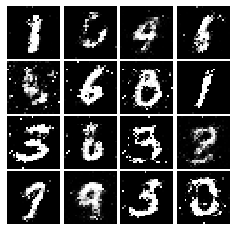

Epoch: 9, Iter: 4540, D: 1.33, G:0.7678


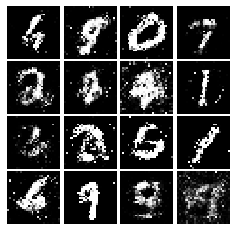

Epoch: 9, Iter: 4560, D: 1.296, G:0.7446


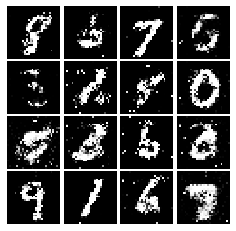

Epoch: 9, Iter: 4580, D: 1.365, G:0.6671


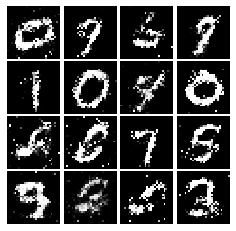

Epoch: 9, Iter: 4600, D: 1.348, G:0.8074


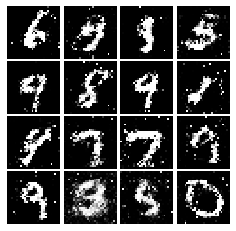

Epoch: 9, Iter: 4620, D: 1.306, G:0.8573


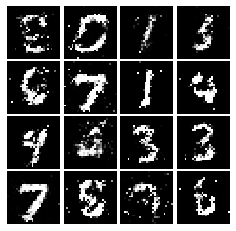

Epoch: 9, Iter: 4640, D: 1.353, G:0.6153


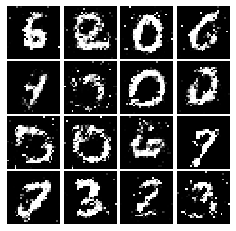

Epoch: 9, Iter: 4660, D: 1.401, G:0.7676


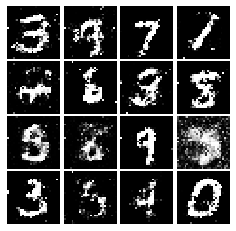

Epoch: 9, Iter: 4680, D: 1.34, G:0.9338


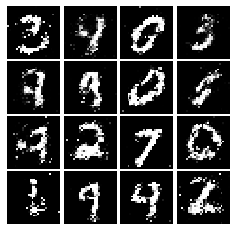

Final images


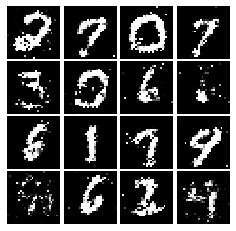

In [17]:
# Make the discriminator
D = discriminator()

# Make the generator
G = generator()

# Use the function you wrote earlier to get optimizers for the Discriminator and the Generator
D_solver, G_solver = get_solvers()

# Run it!
run_a_gan(D, G, D_solver, G_solver, discriminator_loss, generator_loss)

# Least Squares GAN
We'll now look at [Least Squares GAN](https://arxiv.org/abs/1611.04076), a newer, more stable alternative to the original GAN loss function. For this part, all we have to do is change the loss function and retrain the model. We'll implement equation (9) in the paper, with the generator loss:
$$\ell_G  =  \frac{1}{2}\mathbb{E}_{z \sim p(z)}\left[\left(D(G(z))-1\right)^2\right]$$
and the discriminator loss:
$$ \ell_D = \frac{1}{2}\mathbb{E}_{x \sim p_\text{data}}\left[\left(D(x)-1\right)^2\right] + \frac{1}{2}\mathbb{E}_{z \sim p(z)}\left[ \left(D(G(z))\right)^2\right]$$


**HINTS**: Instead of computing the expectation, we will be averaging over elements of the minibatch, so make sure to combine the loss by averaging instead of summing. When plugging in for $D(x)$ and $D(G(z))$ use the direct output from the discriminator (`score_real` and `score_fake`).

In [18]:
def ls_discriminator_loss(scores_real, scores_fake):
    """
    Compute the Least-Squares GAN loss for the discriminator.
    
    Inputs:
    - scores_real: Tensor of shape (N, 1) giving scores for the real data.
    - scores_fake: Tensor of shape (N, 1) giving scores for the fake data.
    
    Outputs:
    - loss: A Tensor containing the loss.
    """
    loss = None
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    bce = tf.keras.losses.BinaryCrossentropy(from_logits=True)
    Gx = tf.reduce_mean(0.5 * ((scores_real -1)** 2))
    Gz = tf.reduce_mean(0.5 * ((scores_fake) ** 2))
    
    loss = Gx + Gz

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return loss

def ls_generator_loss(scores_fake):
    """
    Computes the Least-Squares GAN loss for the generator.
    
    Inputs:
    - scores_fake: Tensor of shape (N, 1) giving scores for the fake data.
    
    Outputs:
    - loss: A Tensor containing the loss.
    """
    loss = None
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    bce = tf.keras.losses.BinaryCrossentropy(from_logits=True)
    
    loss = tf.reduce_mean((scores_fake -1)**2 / 2)

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return loss

Test your LSGAN loss. You should see errors less than 1e-8.

In [19]:
def test_lsgan_loss(score_real, score_fake, d_loss_true, g_loss_true):
    
    d_loss = ls_discriminator_loss(tf.constant(score_real), tf.constant(score_fake))
    g_loss = ls_generator_loss(tf.constant(score_fake))
    print("Maximum error in d_loss: %g"%rel_error(d_loss_true, d_loss))
    print("Maximum error in g_loss: %g"%rel_error(g_loss_true, g_loss))

test_lsgan_loss(answers['logits_real'], answers['logits_fake'],
                answers['d_loss_lsgan_true'], answers['g_loss_lsgan_true'])

Maximum error in d_loss: 0
Maximum error in g_loss: 0


Create new training steps so we instead minimize the LSGAN loss:

Epoch: 0, Iter: 0, D: 0.2379, G:0.375


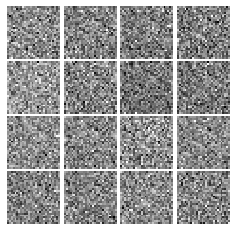

Epoch: 0, Iter: 20, D: 0.09583, G:1.127


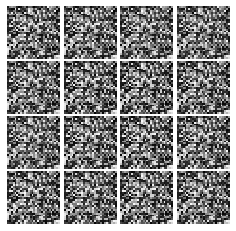

Epoch: 0, Iter: 40, D: 0.04853, G:0.7456


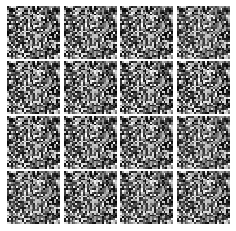

Epoch: 0, Iter: 60, D: 0.01277, G:0.5785


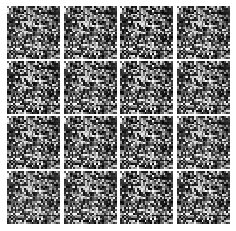

Epoch: 0, Iter: 80, D: 0.0654, G:0.8724


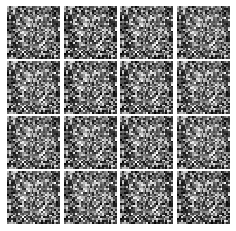

Epoch: 0, Iter: 100, D: 0.0178, G:0.6457


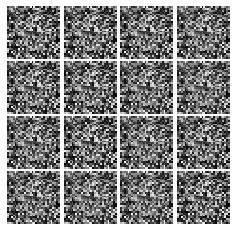

Epoch: 0, Iter: 120, D: 0.003652, G:0.5509


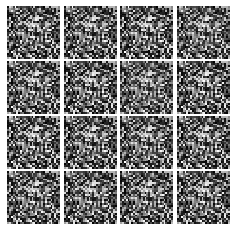

Epoch: 0, Iter: 140, D: 0.008471, G:0.6534


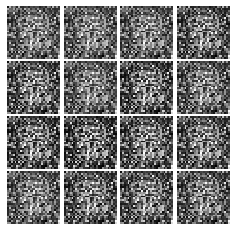

Epoch: 0, Iter: 160, D: 0.06339, G:1.179


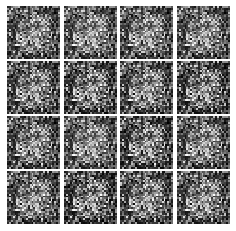

Epoch: 0, Iter: 180, D: 0.1366, G:0.4072


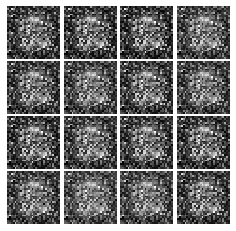

Epoch: 0, Iter: 200, D: 0.1898, G:0.2966


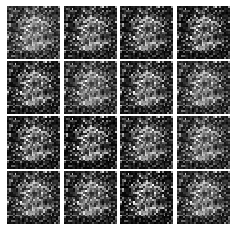

Epoch: 0, Iter: 220, D: 0.2016, G:0.2126


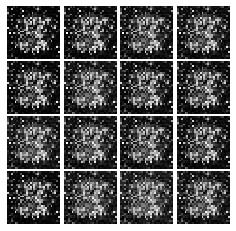

Epoch: 0, Iter: 240, D: 0.1652, G:0.3741


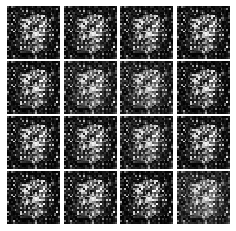

Epoch: 0, Iter: 260, D: 0.2065, G:0.1438


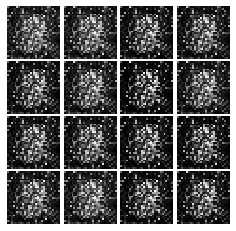

Epoch: 0, Iter: 280, D: 0.1336, G:0.5593


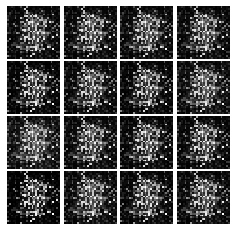

Epoch: 0, Iter: 300, D: 0.3765, G:0.0751


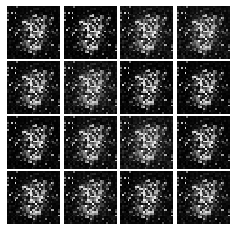

Epoch: 0, Iter: 320, D: 0.116, G:0.3626


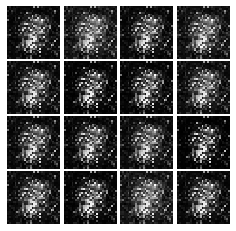

Epoch: 0, Iter: 340, D: 0.102, G:0.2901


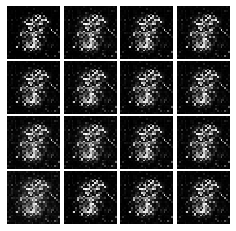

Epoch: 0, Iter: 360, D: 0.1736, G:0.7258


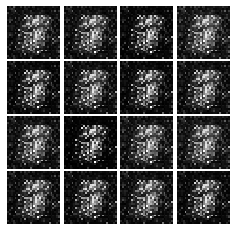

Epoch: 0, Iter: 380, D: 0.1065, G:0.4363


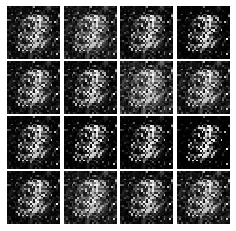

Epoch: 0, Iter: 400, D: 0.1556, G:0.4157


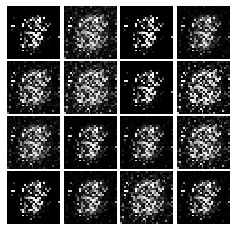

Epoch: 0, Iter: 420, D: 0.1706, G:0.3553


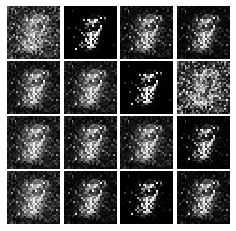

Epoch: 0, Iter: 440, D: 0.1248, G:0.4763


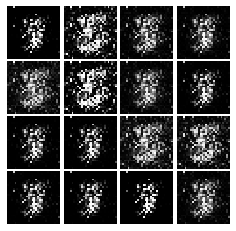

Epoch: 0, Iter: 460, D: 0.1441, G:0.3632


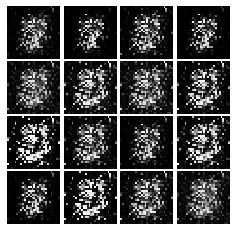

Epoch: 1, Iter: 480, D: 0.1555, G:0.2956


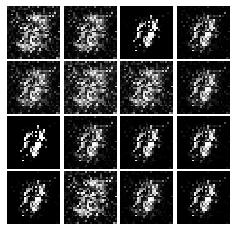

Epoch: 1, Iter: 500, D: 0.1057, G:0.4131


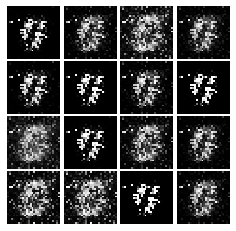

Epoch: 1, Iter: 520, D: 0.2421, G:0.1554


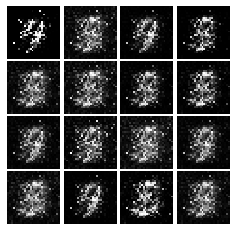

Epoch: 1, Iter: 540, D: 0.1455, G:0.4327


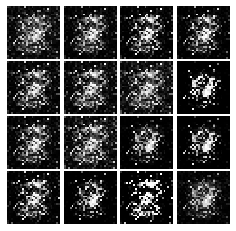

Epoch: 1, Iter: 560, D: 0.234, G:0.2469


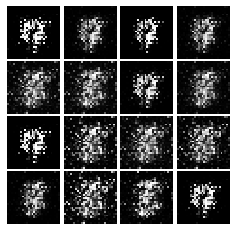

Epoch: 1, Iter: 580, D: 0.1545, G:0.3938


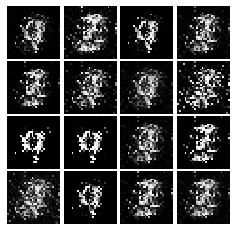

Epoch: 1, Iter: 600, D: 0.1638, G:0.3228


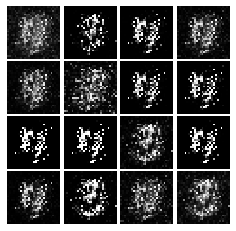

Epoch: 1, Iter: 620, D: 0.2077, G:0.2712


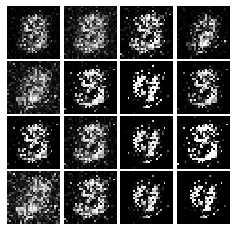

Epoch: 1, Iter: 640, D: 0.1152, G:0.2326


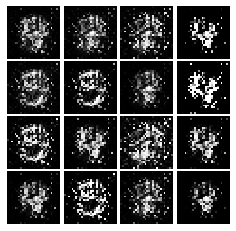

Epoch: 1, Iter: 660, D: 0.1747, G:0.2625


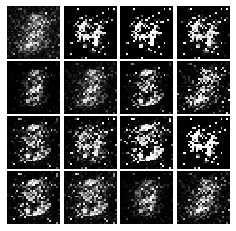

Epoch: 1, Iter: 680, D: 0.1575, G:0.3927


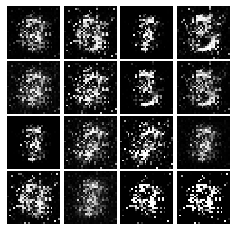

Epoch: 1, Iter: 700, D: 0.1011, G:0.3565


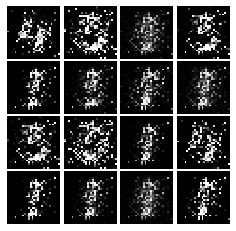

Epoch: 1, Iter: 720, D: 0.1296, G:0.3578


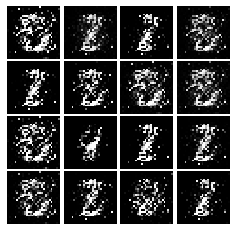

Epoch: 1, Iter: 740, D: 0.07424, G:0.9216


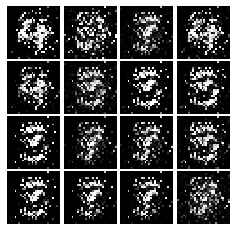

Epoch: 1, Iter: 760, D: 0.1453, G:0.2754


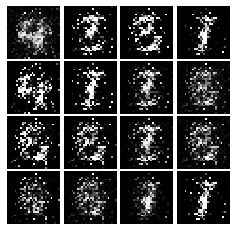

Epoch: 1, Iter: 780, D: 0.1194, G:0.5227


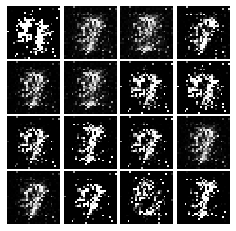

Epoch: 1, Iter: 800, D: 0.09069, G:0.4355


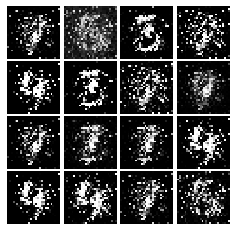

Epoch: 1, Iter: 820, D: 0.3408, G:0.3883


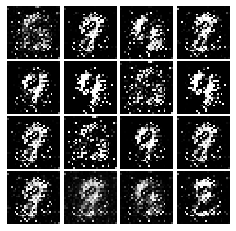

Epoch: 1, Iter: 840, D: 0.128, G:0.4297


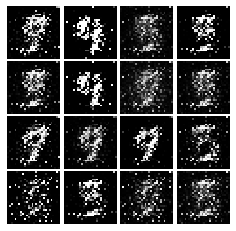

Epoch: 1, Iter: 860, D: 0.205, G:0.3232


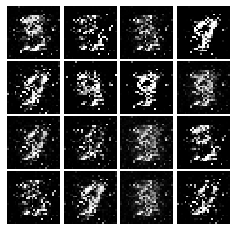

Epoch: 1, Iter: 880, D: 0.1019, G:0.4124


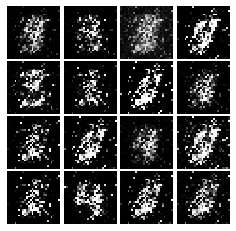

Epoch: 1, Iter: 900, D: 0.1167, G:0.4169


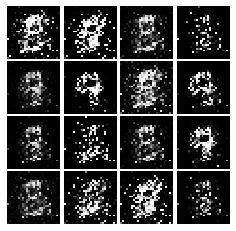

Epoch: 1, Iter: 920, D: 0.1999, G:0.2808


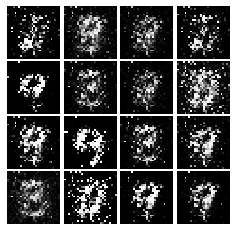

Epoch: 2, Iter: 940, D: 0.1478, G:0.3436


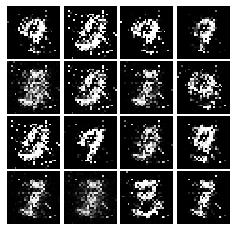

Epoch: 2, Iter: 960, D: 0.1536, G:0.3643


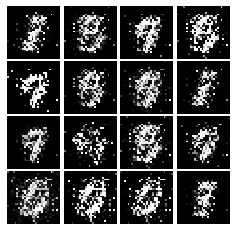

Epoch: 2, Iter: 980, D: 0.3625, G:0.6718


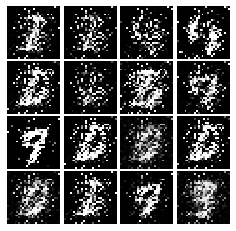

Epoch: 2, Iter: 1000, D: 0.1584, G:0.3204


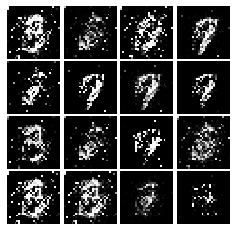

Epoch: 2, Iter: 1020, D: 0.1507, G:0.2101


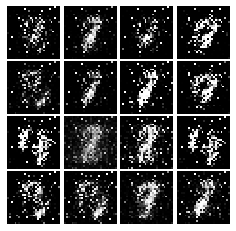

Epoch: 2, Iter: 1040, D: 0.1204, G:0.4053


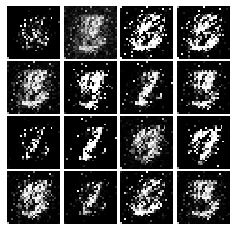

Epoch: 2, Iter: 1060, D: 0.8261, G:0.2898


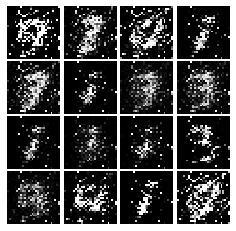

Epoch: 2, Iter: 1080, D: 0.1727, G:0.2836


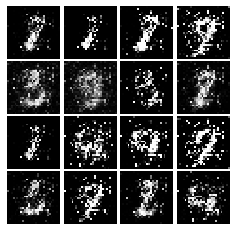

Epoch: 2, Iter: 1100, D: 0.1409, G:0.4199


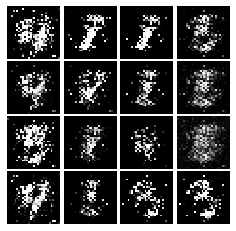

Epoch: 2, Iter: 1120, D: 0.1521, G:0.3801


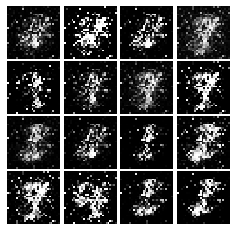

Epoch: 2, Iter: 1140, D: 0.1615, G:0.399


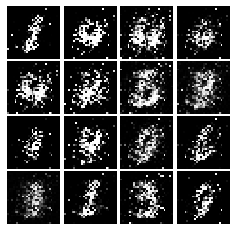

Epoch: 2, Iter: 1160, D: 0.1604, G:0.3219


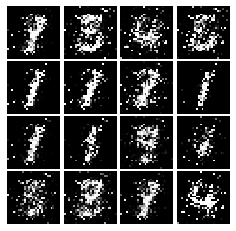

Epoch: 2, Iter: 1180, D: 0.213, G:0.2475


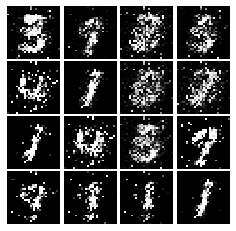

Epoch: 2, Iter: 1200, D: 0.162, G:0.3643


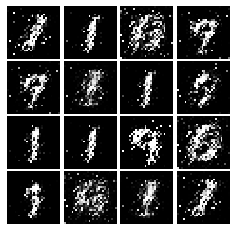

Epoch: 2, Iter: 1220, D: 0.1687, G:0.2942


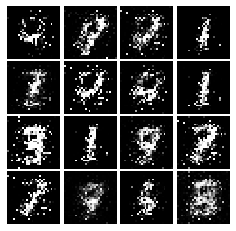

Epoch: 2, Iter: 1240, D: 0.142, G:0.3267


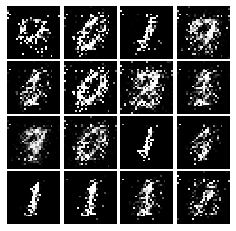

Epoch: 2, Iter: 1260, D: 0.139, G:0.4005


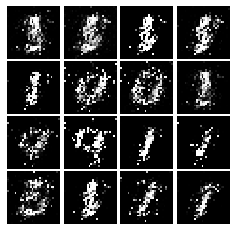

Epoch: 2, Iter: 1280, D: 0.1728, G:0.4313


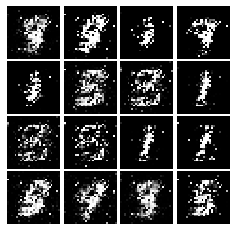

Epoch: 2, Iter: 1300, D: 0.1247, G:0.4294


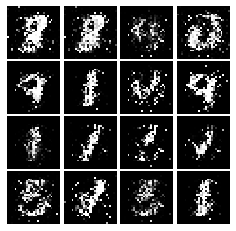

Epoch: 2, Iter: 1320, D: 0.1889, G:0.2299


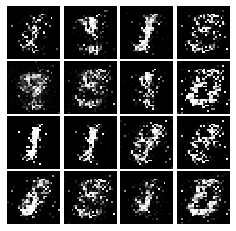

Epoch: 2, Iter: 1340, D: 0.1697, G:0.2857


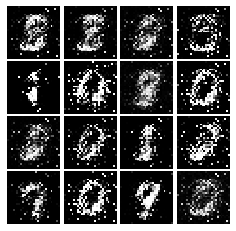

Epoch: 2, Iter: 1360, D: 0.1739, G:0.221


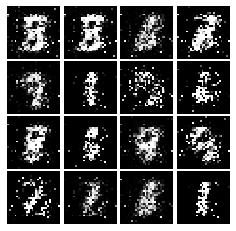

Epoch: 2, Iter: 1380, D: 0.1582, G:0.2809


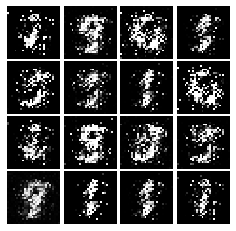

Epoch: 2, Iter: 1400, D: 0.132, G:0.3388


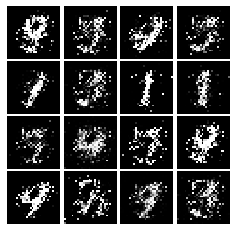

Epoch: 3, Iter: 1420, D: 0.1846, G:0.2149


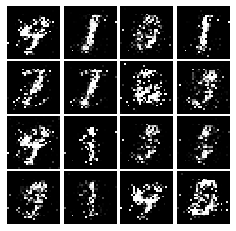

Epoch: 3, Iter: 1440, D: 0.168, G:0.3042


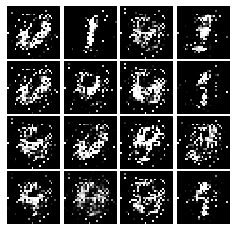

Epoch: 3, Iter: 1460, D: 0.197, G:0.2323


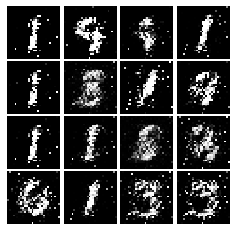

Epoch: 3, Iter: 1480, D: 0.1793, G:0.263


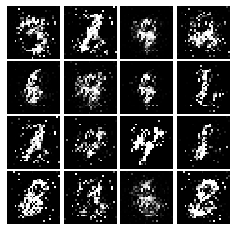

Epoch: 3, Iter: 1500, D: 0.2109, G:0.2846


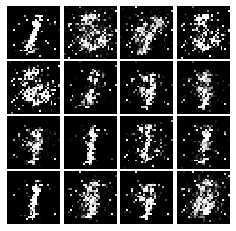

Epoch: 3, Iter: 1520, D: 0.2396, G:0.1968


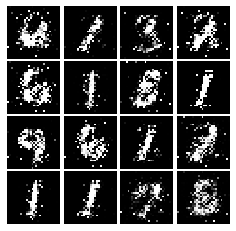

Epoch: 3, Iter: 1540, D: 0.1923, G:0.2504


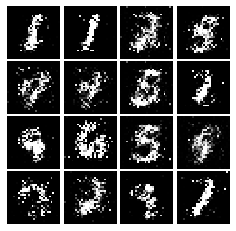

Epoch: 3, Iter: 1560, D: 0.1895, G:0.2544


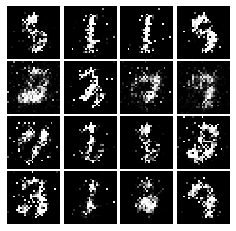

Epoch: 3, Iter: 1580, D: 0.1962, G:0.253


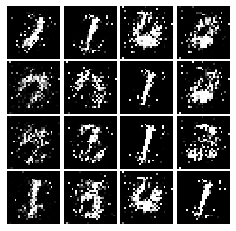

Epoch: 3, Iter: 1600, D: 0.2151, G:0.1784


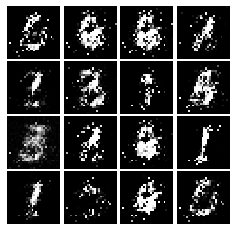

Epoch: 3, Iter: 1620, D: 0.1804, G:0.1863


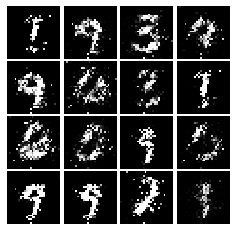

Epoch: 3, Iter: 1640, D: 0.18, G:0.2296


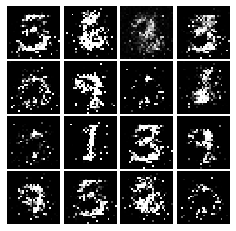

Epoch: 3, Iter: 1660, D: 0.2713, G:0.2795


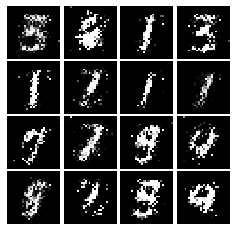

Epoch: 3, Iter: 1680, D: 0.1604, G:0.2866


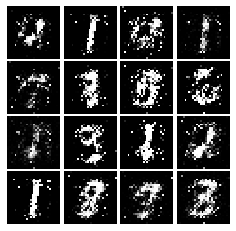

Epoch: 3, Iter: 1700, D: 0.176, G:0.2266


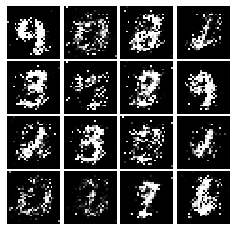

Epoch: 3, Iter: 1720, D: 0.198, G:0.1704


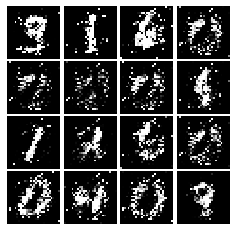

Epoch: 3, Iter: 1740, D: 0.1746, G:0.3178


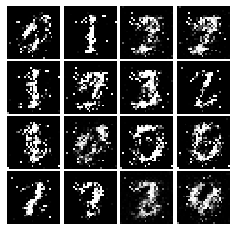

Epoch: 3, Iter: 1760, D: 0.1691, G:0.1941


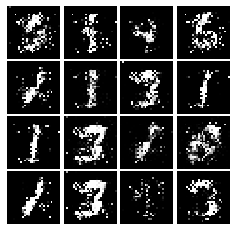

Epoch: 3, Iter: 1780, D: 0.1825, G:1.033


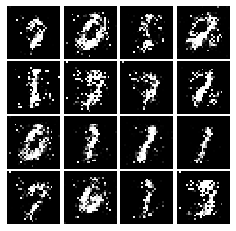

Epoch: 3, Iter: 1800, D: 0.2089, G:0.2099


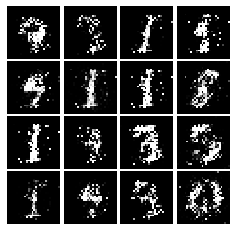

Epoch: 3, Iter: 1820, D: 0.2053, G:0.2138


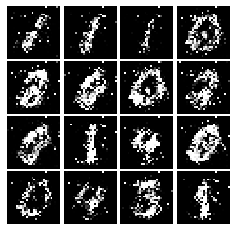

Epoch: 3, Iter: 1840, D: 0.2262, G:0.319


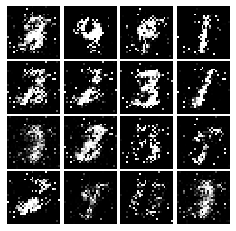

Epoch: 3, Iter: 1860, D: 0.202, G:0.2842


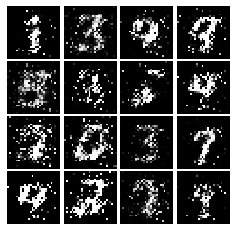

Epoch: 4, Iter: 1880, D: 0.1778, G:0.2621


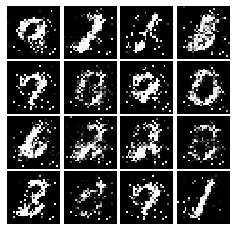

Epoch: 4, Iter: 1900, D: 0.183, G:0.26


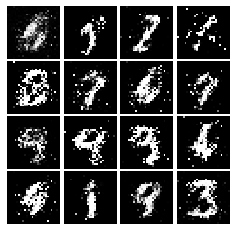

Epoch: 4, Iter: 1920, D: 0.1676, G:0.2285


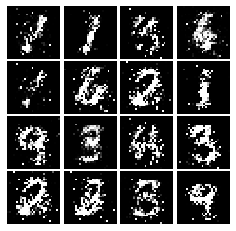

Epoch: 4, Iter: 1940, D: 0.1656, G:0.2317


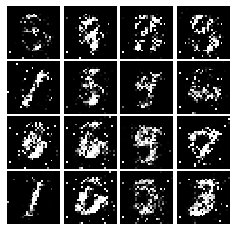

Epoch: 4, Iter: 1960, D: 0.2017, G:0.2217


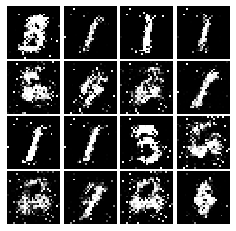

Epoch: 4, Iter: 1980, D: 0.1848, G:0.221


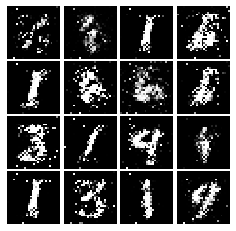

Epoch: 4, Iter: 2000, D: 0.2062, G:0.2068


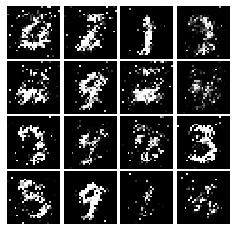

Epoch: 4, Iter: 2020, D: 0.1983, G:0.2225


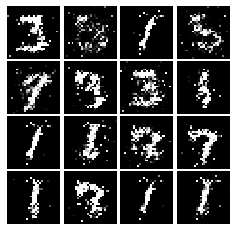

Epoch: 4, Iter: 2040, D: 0.218, G:0.224


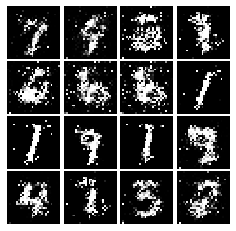

Epoch: 4, Iter: 2060, D: 0.2357, G:0.1907


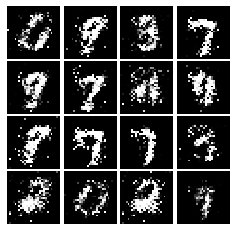

Epoch: 4, Iter: 2080, D: 0.2239, G:0.1711


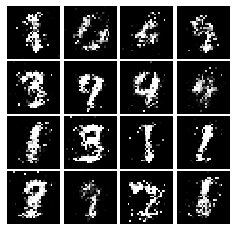

Epoch: 4, Iter: 2100, D: 0.1908, G:0.1971


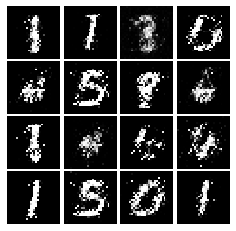

Epoch: 4, Iter: 2120, D: 0.2088, G:0.1878


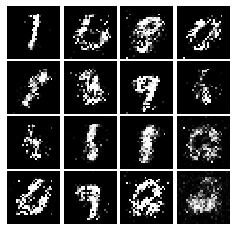

Epoch: 4, Iter: 2140, D: 0.203, G:0.1964


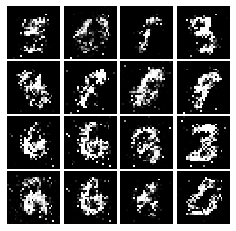

Epoch: 4, Iter: 2160, D: 0.2225, G:0.2026


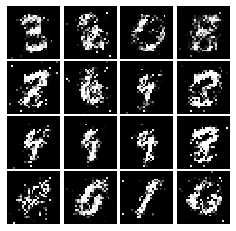

Epoch: 4, Iter: 2180, D: 0.2053, G:0.2004


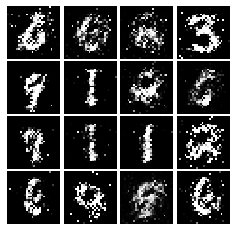

Epoch: 4, Iter: 2200, D: 0.1836, G:0.2446


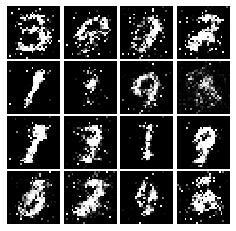

Epoch: 4, Iter: 2220, D: 0.213, G:0.2212


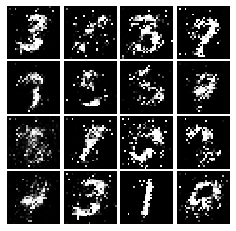

Epoch: 4, Iter: 2240, D: 0.194, G:0.2089


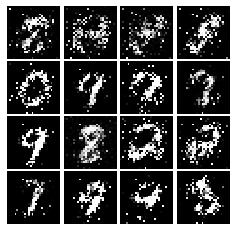

Epoch: 4, Iter: 2260, D: 0.2189, G:0.2345


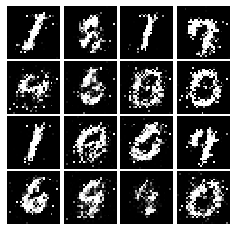

Epoch: 4, Iter: 2280, D: 0.2319, G:0.1983


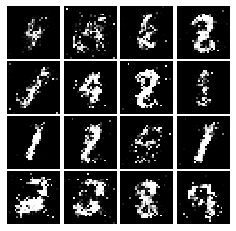

Epoch: 4, Iter: 2300, D: 0.2218, G:0.212


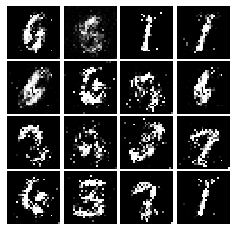

Epoch: 4, Iter: 2320, D: 0.2068, G:0.2642


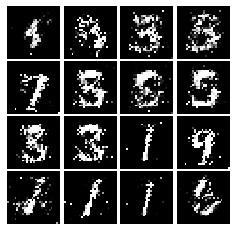

Epoch: 4, Iter: 2340, D: 0.1867, G:0.26


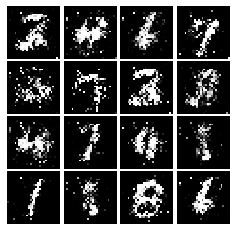

Epoch: 5, Iter: 2360, D: 0.2079, G:0.2084


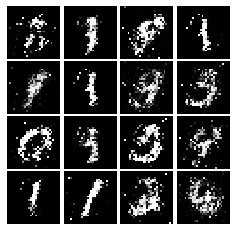

Epoch: 5, Iter: 2380, D: 0.2247, G:0.2076


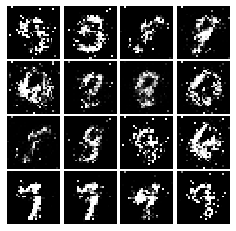

Epoch: 5, Iter: 2400, D: 0.197, G:0.2124


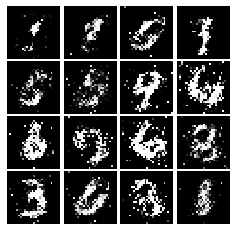

Epoch: 5, Iter: 2420, D: 0.1921, G:0.2259


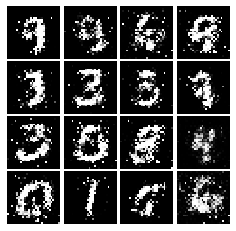

Epoch: 5, Iter: 2440, D: 0.2016, G:0.2173


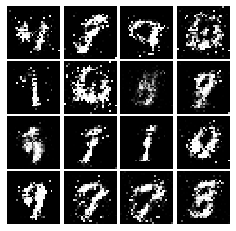

Epoch: 5, Iter: 2460, D: 0.2143, G:0.2438


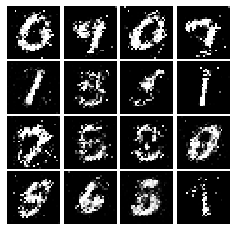

Epoch: 5, Iter: 2480, D: 0.1958, G:0.2379


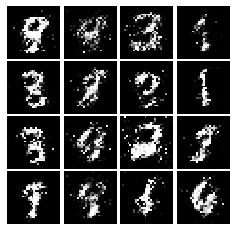

Epoch: 5, Iter: 2500, D: 0.1787, G:0.227


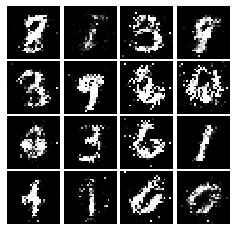

Epoch: 5, Iter: 2520, D: 0.2523, G:0.2137


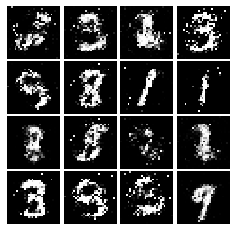

Epoch: 5, Iter: 2540, D: 0.2379, G:0.1863


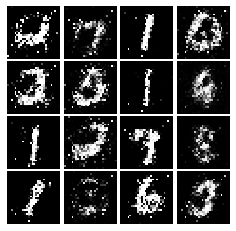

Epoch: 5, Iter: 2560, D: 0.2214, G:0.1808


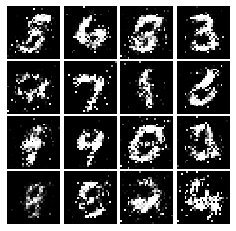

Epoch: 5, Iter: 2580, D: 0.2003, G:0.2305


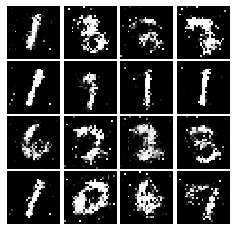

Epoch: 5, Iter: 2600, D: 0.2012, G:0.1817


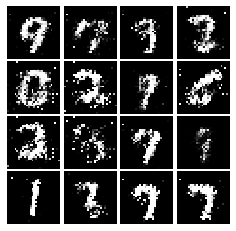

Epoch: 5, Iter: 2620, D: 0.2087, G:0.2021


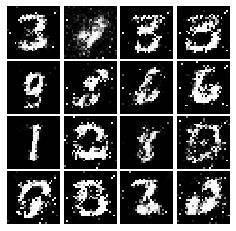

Epoch: 5, Iter: 2640, D: 0.2194, G:0.2062


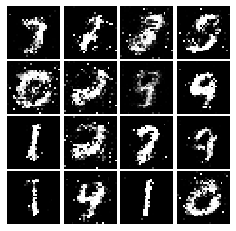

Epoch: 5, Iter: 2660, D: 0.226, G:0.1692


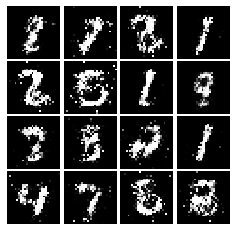

Epoch: 5, Iter: 2680, D: 0.2253, G:0.1749


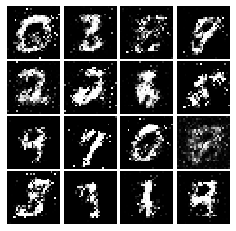

Epoch: 5, Iter: 2700, D: 0.2194, G:0.1696


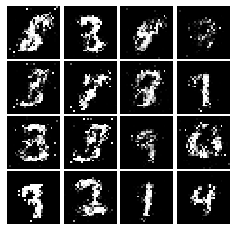

Epoch: 5, Iter: 2720, D: 0.2012, G:0.1945


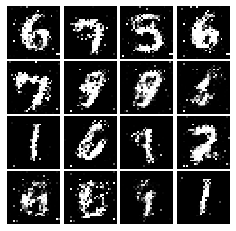

Epoch: 5, Iter: 2740, D: 0.2234, G:0.1696


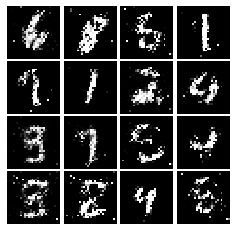

Epoch: 5, Iter: 2760, D: 0.2176, G:0.1485


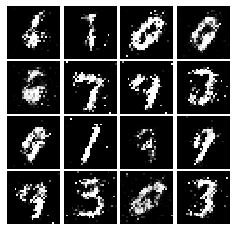

Epoch: 5, Iter: 2780, D: 0.2404, G:0.1763


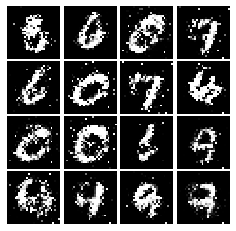

Epoch: 5, Iter: 2800, D: 0.1998, G:0.1973


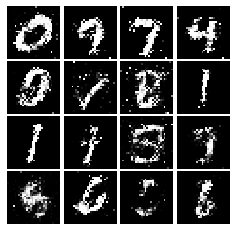

Epoch: 6, Iter: 2820, D: 0.2368, G:0.1867


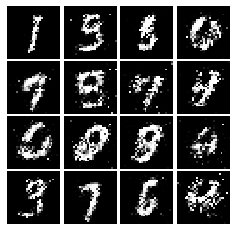

Epoch: 6, Iter: 2840, D: 0.2243, G:0.1726


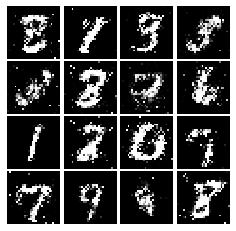

Epoch: 6, Iter: 2860, D: 0.2101, G:0.2016


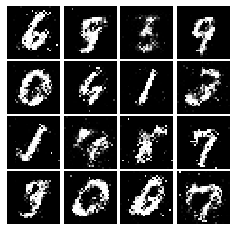

Epoch: 6, Iter: 2880, D: 0.2293, G:0.2251


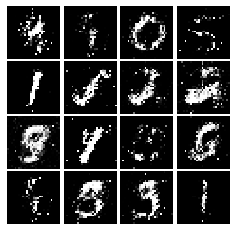

Epoch: 6, Iter: 2900, D: 0.2069, G:0.1897


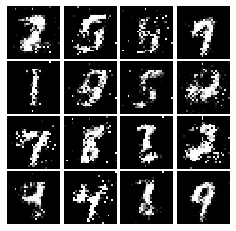

Epoch: 6, Iter: 2920, D: 0.2068, G:0.2371


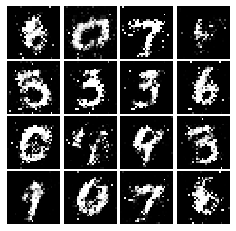

Epoch: 6, Iter: 2940, D: 0.2204, G:0.2126


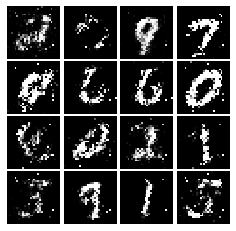

Epoch: 6, Iter: 2960, D: 0.2306, G:0.1934


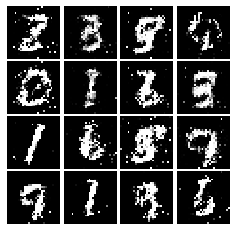

Epoch: 6, Iter: 2980, D: 0.2241, G:0.1774


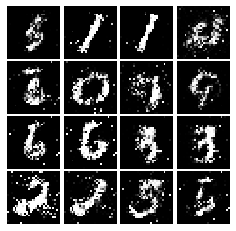

Epoch: 6, Iter: 3000, D: 0.2429, G:0.1818


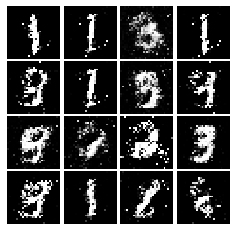

Epoch: 6, Iter: 3020, D: 0.2053, G:0.2081


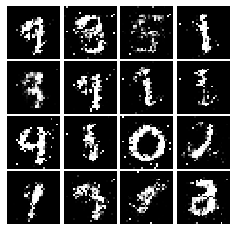

Epoch: 6, Iter: 3040, D: 0.2338, G:0.1769


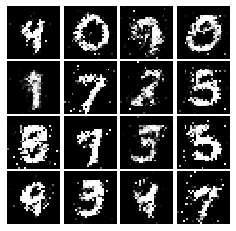

Epoch: 6, Iter: 3060, D: 0.2137, G:0.161


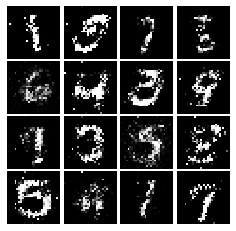

Epoch: 6, Iter: 3080, D: 0.1972, G:0.2056


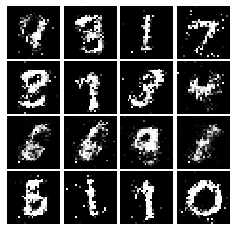

Epoch: 6, Iter: 3100, D: 0.1992, G:0.2063


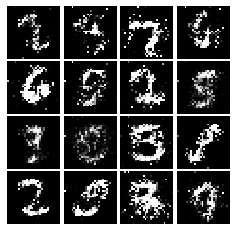

Epoch: 6, Iter: 3120, D: 0.2252, G:0.1848


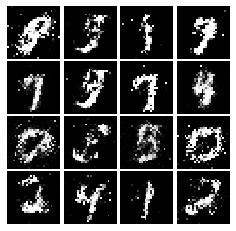

Epoch: 6, Iter: 3140, D: 0.235, G:0.1637


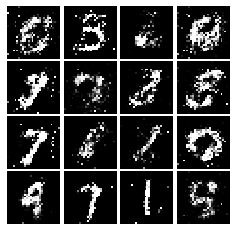

Epoch: 6, Iter: 3160, D: 0.2149, G:0.1889


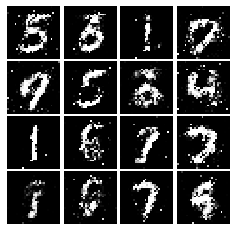

Epoch: 6, Iter: 3180, D: 0.2129, G:0.2097


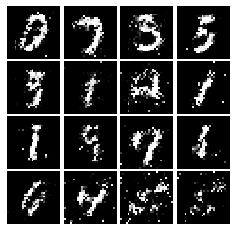

Epoch: 6, Iter: 3200, D: 0.2128, G:0.2051


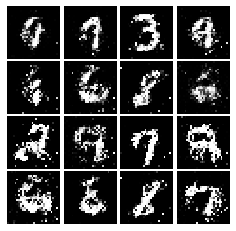

Epoch: 6, Iter: 3220, D: 0.2137, G:0.1753


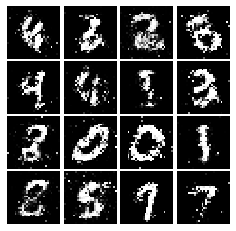

Epoch: 6, Iter: 3240, D: 0.2152, G:0.1795


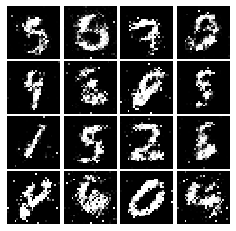

Epoch: 6, Iter: 3260, D: 0.2315, G:0.1737


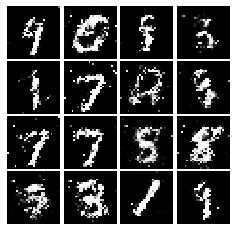

Epoch: 6, Iter: 3280, D: 0.2136, G:0.1712


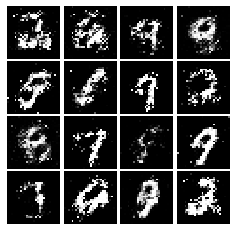

Epoch: 7, Iter: 3300, D: 0.219, G:0.1803


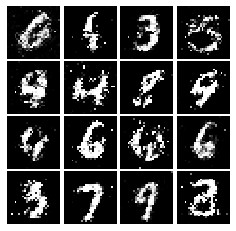

Epoch: 7, Iter: 3320, D: 0.2224, G:0.1732


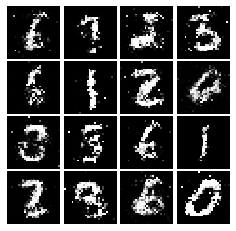

Epoch: 7, Iter: 3340, D: 0.2088, G:0.1901


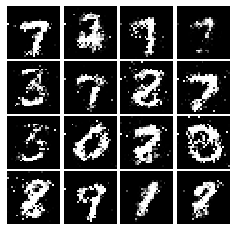

Epoch: 7, Iter: 3360, D: 0.2734, G:0.1996


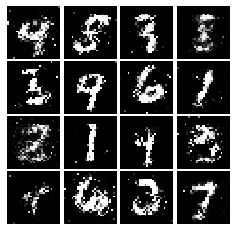

Epoch: 7, Iter: 3380, D: 0.2117, G:0.1733


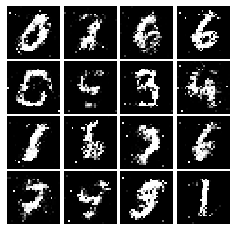

Epoch: 7, Iter: 3400, D: 0.2389, G:0.1547


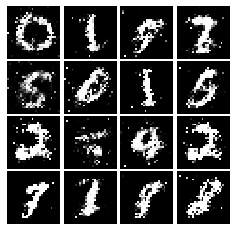

Epoch: 7, Iter: 3420, D: 0.245, G:0.1884


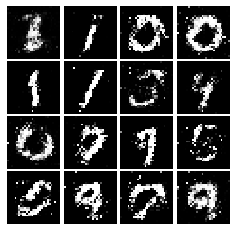

Epoch: 7, Iter: 3440, D: 0.2248, G:0.206


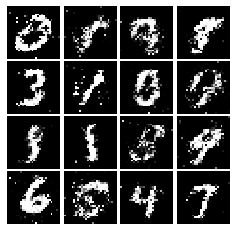

Epoch: 7, Iter: 3460, D: 0.2015, G:0.1871


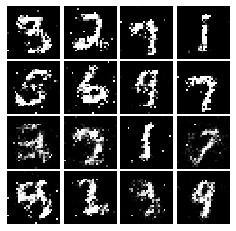

Epoch: 7, Iter: 3480, D: 0.228, G:0.1644


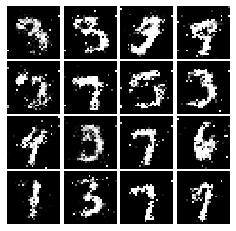

Epoch: 7, Iter: 3500, D: 0.2371, G:0.1687


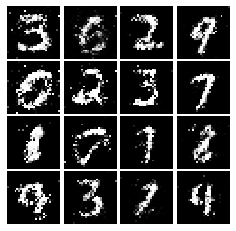

Epoch: 7, Iter: 3520, D: 0.2325, G:0.178


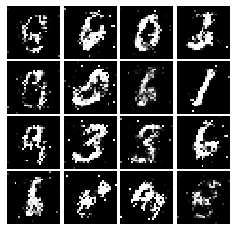

Epoch: 7, Iter: 3540, D: 0.238, G:0.1839


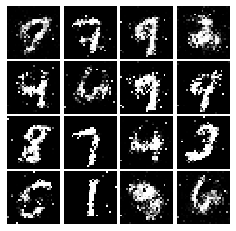

Epoch: 7, Iter: 3560, D: 0.2101, G:0.2031


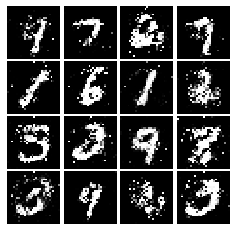

Epoch: 7, Iter: 3580, D: 0.2147, G:0.1648


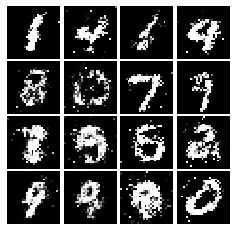

Epoch: 7, Iter: 3600, D: 0.2417, G:0.1725


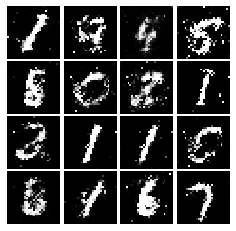

Epoch: 7, Iter: 3620, D: 0.2258, G:0.1514


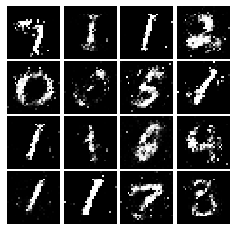

Epoch: 7, Iter: 3640, D: 0.2186, G:0.1664


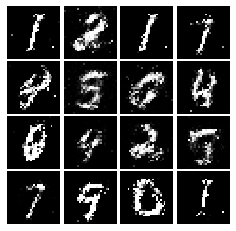

Epoch: 7, Iter: 3660, D: 0.2304, G:0.1712


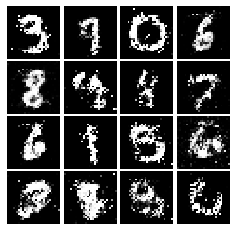

Epoch: 7, Iter: 3680, D: 0.2483, G:0.1848


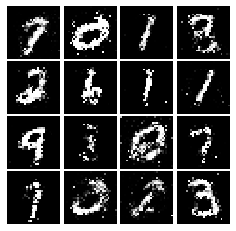

Epoch: 7, Iter: 3700, D: 0.2093, G:0.1854


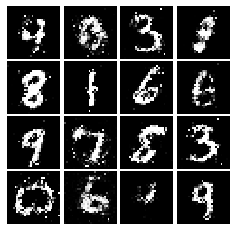

Epoch: 7, Iter: 3720, D: 0.2253, G:0.1747


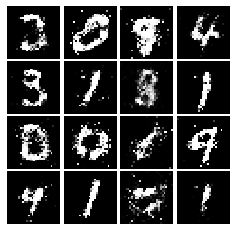

Epoch: 7, Iter: 3740, D: 0.2321, G:0.1603


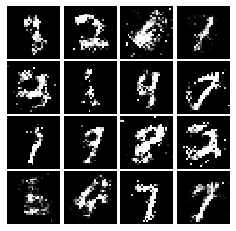

Epoch: 8, Iter: 3760, D: 0.2227, G:0.1818


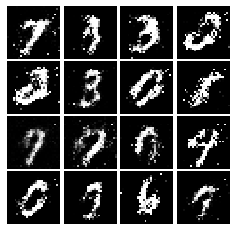

Epoch: 8, Iter: 3780, D: 0.2431, G:0.1673


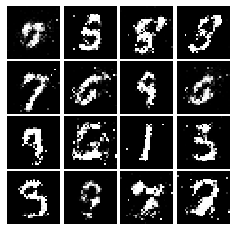

Epoch: 8, Iter: 3800, D: 0.2244, G:0.1739


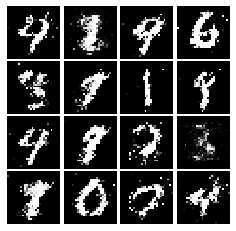

Epoch: 8, Iter: 3820, D: 0.2215, G:0.1613


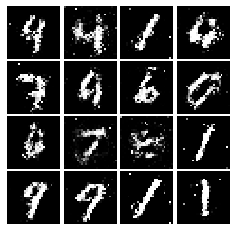

Epoch: 8, Iter: 3840, D: 0.2438, G:0.1689


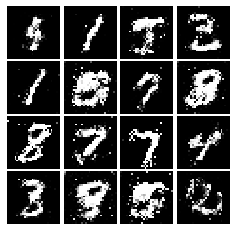

Epoch: 8, Iter: 3860, D: 0.2114, G:0.1918


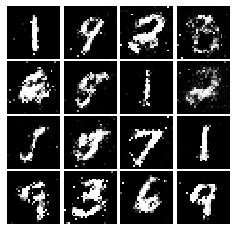

Epoch: 8, Iter: 3880, D: 0.2313, G:0.1424


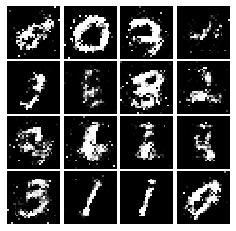

Epoch: 8, Iter: 3900, D: 0.2336, G:0.1846


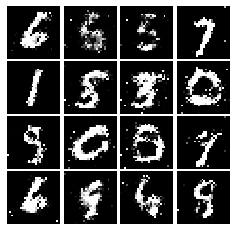

Epoch: 8, Iter: 3920, D: 0.2269, G:0.151


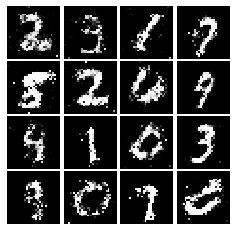

Epoch: 8, Iter: 3940, D: 0.2296, G:0.1628


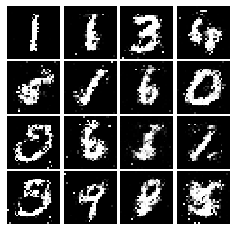

Epoch: 8, Iter: 3960, D: 0.2436, G:0.1454


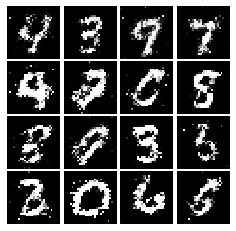

Epoch: 8, Iter: 3980, D: 0.2283, G:0.1752


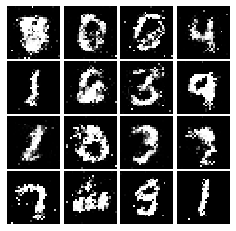

Epoch: 8, Iter: 4000, D: 0.2149, G:0.1633


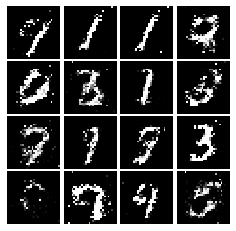

Epoch: 8, Iter: 4020, D: 0.2269, G:0.1578


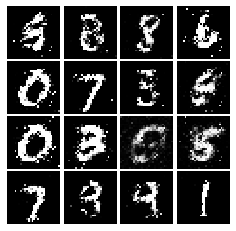

Epoch: 8, Iter: 4040, D: 0.2281, G:0.1819


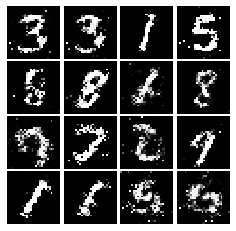

Epoch: 8, Iter: 4060, D: 0.2201, G:0.1606


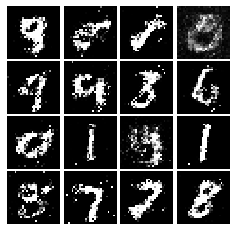

Epoch: 8, Iter: 4080, D: 0.2359, G:0.1527


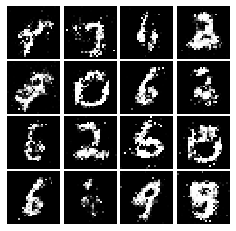

Epoch: 8, Iter: 4100, D: 0.2522, G:0.15


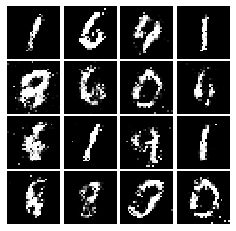

Epoch: 8, Iter: 4120, D: 0.2204, G:0.1688


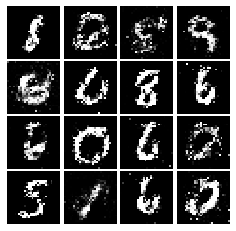

Epoch: 8, Iter: 4140, D: 0.2224, G:0.183


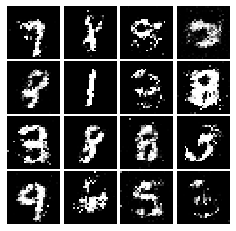

Epoch: 8, Iter: 4160, D: 0.2431, G:0.1663


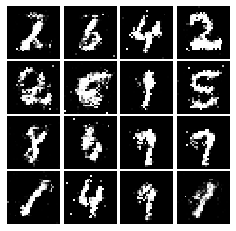

Epoch: 8, Iter: 4180, D: 0.2457, G:0.1694


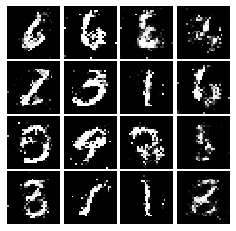

Epoch: 8, Iter: 4200, D: 0.2259, G:0.1695


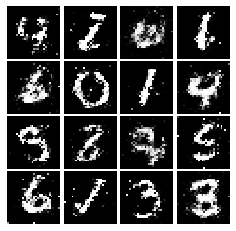

Epoch: 8, Iter: 4220, D: 0.2246, G:0.1651


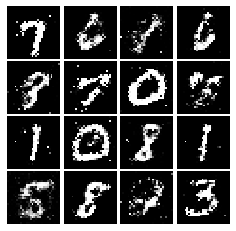

Epoch: 9, Iter: 4240, D: 0.245, G:0.1344


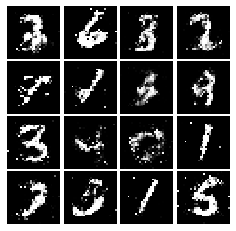

Epoch: 9, Iter: 4260, D: 0.2323, G:0.1459


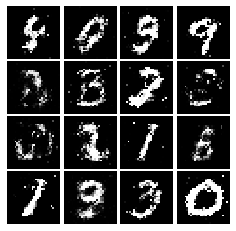

Epoch: 9, Iter: 4280, D: 0.235, G:0.1657


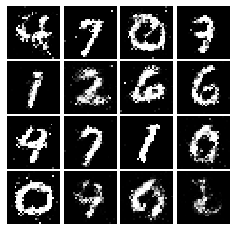

Epoch: 9, Iter: 4300, D: 0.2356, G:0.1662


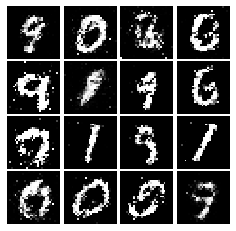

Epoch: 9, Iter: 4320, D: 0.2438, G:0.1662


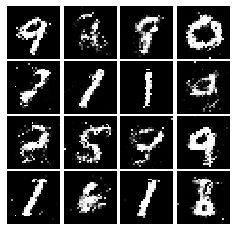

Epoch: 9, Iter: 4340, D: 0.2187, G:0.2093


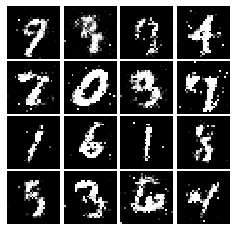

Epoch: 9, Iter: 4360, D: 0.2503, G:0.148


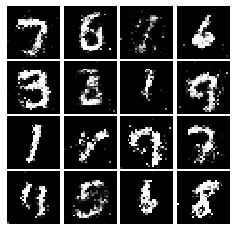

Epoch: 9, Iter: 4380, D: 0.2625, G:0.1771


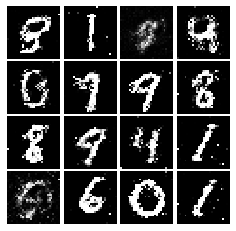

Epoch: 9, Iter: 4400, D: 0.228, G:0.1789


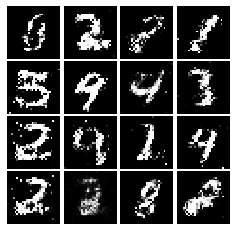

Epoch: 9, Iter: 4420, D: 0.2235, G:0.1539


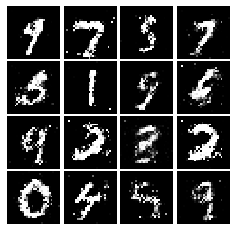

Epoch: 9, Iter: 4440, D: 0.2501, G:0.1326


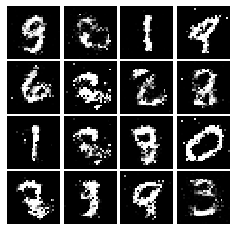

Epoch: 9, Iter: 4460, D: 0.231, G:0.1695


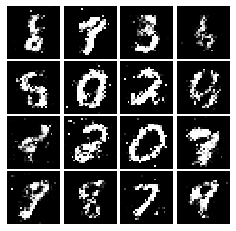

Epoch: 9, Iter: 4480, D: 0.2434, G:0.1489


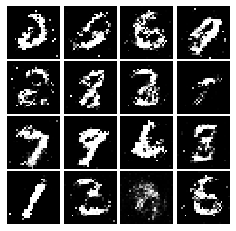

Epoch: 9, Iter: 4500, D: 0.2428, G:0.1581


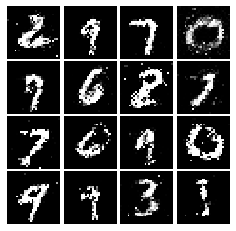

Epoch: 9, Iter: 4520, D: 0.2372, G:0.1898


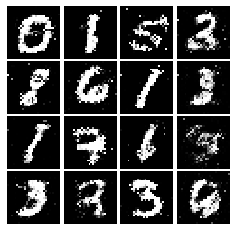

Epoch: 9, Iter: 4540, D: 0.2572, G:0.148


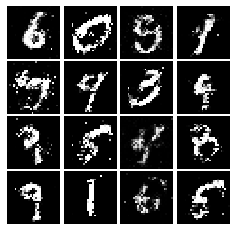

Epoch: 9, Iter: 4560, D: 0.2395, G:0.1701


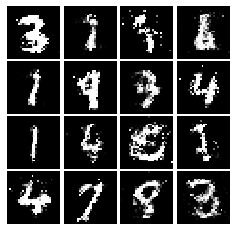

Epoch: 9, Iter: 4580, D: 0.2431, G:0.1509


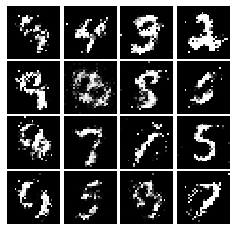

Epoch: 9, Iter: 4600, D: 0.2404, G:0.17


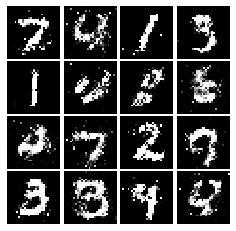

Epoch: 9, Iter: 4620, D: 0.2378, G:0.1493


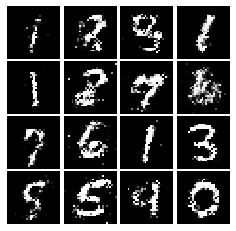

Epoch: 9, Iter: 4640, D: 0.226, G:0.1618


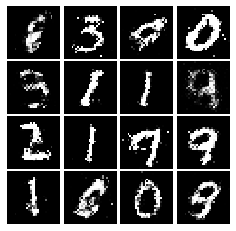

Epoch: 9, Iter: 4660, D: 0.2308, G:0.1611


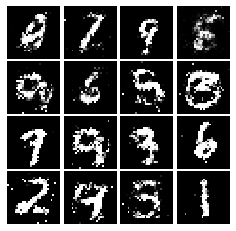

Epoch: 9, Iter: 4680, D: 0.2488, G:0.1491


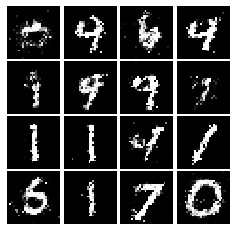

Final images


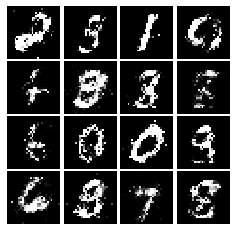

In [20]:
# Make the discriminator
D = discriminator()

# Make the generator
G = generator()

# Use the function you wrote earlier to get optimizers for the Discriminator and the Generator
D_solver, G_solver = get_solvers()

# Run it!
run_a_gan(D, G, D_solver, G_solver, ls_discriminator_loss, ls_generator_loss)

# Deep Convolutional GANs
In the first part of the notebook, we implemented an almost direct copy of the original GAN network from Ian Goodfellow. However, this network architecture allows no real spatial reasoning. It is unable to reason about things like "sharp edges" in general because it lacks any convolutional layers. Thus, in this section, we will implement some of the ideas from [DCGAN](https://arxiv.org/abs/1511.06434), where we use convolutional networks as our discriminators and generators.

#### Discriminator
We will use a discriminator inspired by the TensorFlow MNIST classification [tutorial](https://www.tensorflow.org/get_started/mnist/pros), which is able to get above 99% accuracy on the MNIST dataset fairly quickly. *Be sure to check the dimensions of x and reshape when needed*, fully connected blocks expect [N,D] Tensors while conv2d blocks expect [N,H,W,C] Tensors. Please use `tf.keras.layers` to define the following architecture:

Architecture:
* Conv2D: 32 Filters, 5x5, Stride 1, padding 0
* Leaky ReLU(alpha=0.01)
* Max Pool 2x2, Stride 2
* Conv2D: 64 Filters, 5x5, Stride 1, padding 0
* Leaky ReLU(alpha=0.01)
* Max Pool 2x2, Stride 2
* Flatten
* Fully Connected with output size 4 x 4 x 64
* Leaky ReLU(alpha=0.01)
* Fully Connected with output size 1

Once again, please use biases for all convolutional and fully connected layers, and use the default parameter initializers. Note that a padding of 0 can be accomplished with the 'VALID' padding option.

In [21]:
from tensorflow.keras.layers import Dense, LeakyReLU, Flatten, Conv2D,MaxPool2D, Reshape

def discriminator():
    """Compute discriminator score for a batch of input images.
    
    Inputs:
    - x: TensorFlow Tensor of flattened input images, shape [batch_size, 784]
    
    Returns:
    TensorFlow Tensor with shape [batch_size, 1], containing the score 
    for an image being real for each input image.
    """
    model = tf.keras.models.Sequential([
        # TODO: implement architecture
        # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
        Reshape(( 28, 28, 1), input_shape=(28*28,)),
        
        Conv2D(32, 5, strides=(1,1),padding='valid'),
        LeakyReLU(0.01),
        MaxPool2D(pool_size=(2,2), strides=(2,2)),
        
        Conv2D(64, 5, strides=(1,1), padding='valid'),
        LeakyReLU(0.01),
        MaxPool2D(pool_size=(2,2), strides=(2,2)),
        
        Flatten(),
        
        Dense(4*4*64),
        LeakyReLU(0.01),
        Dense(1)
    
        # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    ])
    return model

model = discriminator()
model.summary()
test_discriminator(1102721)

Model: "sequential_6"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
reshape (Reshape)            (None, 28, 28, 1)         0         
_________________________________________________________________
conv2d (Conv2D)              (None, 24, 24, 32)        832       
_________________________________________________________________
leaky_re_lu_6 (LeakyReLU)    (None, 24, 24, 32)        0         
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 12, 12, 32)        0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 8, 8, 64)          51264     
_________________________________________________________________
leaky_re_lu_7 (LeakyReLU)    (None, 8, 8, 64)          0         
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 4, 4, 64)         

#### Generator
For the generator, we will copy the architecture exactly from the [InfoGAN paper](https://arxiv.org/pdf/1606.03657.pdf). See Appendix C.1 MNIST. Please use `tf.keras.layers` for your implementation. You might find the documentation for [tf.keras.layers.Conv2DTranspose](https://www.tensorflow.org/versions/r2.0/api_docs/python/tf/keras/layers/Conv2DTranspose) useful. The architecture is as follows.

Architecture:
* Fully connected with output size 1024 
* `ReLU`
* BatchNorm
* Fully connected with output size 7 x 7 x 128 
* `ReLU`
* BatchNorm
* Resize into Image Tensor of size 7, 7, 128
* Conv2D^T (transpose): 64 filters of 4x4, stride 2
* `ReLU`
* BatchNorm
* Conv2d^T (transpose): 1 filter of 4x4, stride 2
* `TanH`

Once again, use biases for the fully connected and transpose convolutional layers. Please use the default initializers for your parameters. For padding, choose the 'same' option for transpose convolutions. For Batch Normalization, assume we are always in 'training' mode.

In [22]:
from tensorflow.keras.layers import BatchNormalization, LeakyReLU, Flatten, Conv2D,MaxPool2D, Conv2DTranspose, Reshape, Activation
def generator(noise_dim=NOISE_DIM):
    """Generate images from a random noise vector.
    
    Inputs:
    - z: TensorFlow Tensor of random noise with shape [batch_size, noise_dim]
    
    Returns:
    TensorFlow Tensor of generated images, with shape [batch_size, 784].
    """
    model = tf.keras.models.Sequential([
    # TODO: implement architecture
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

        Dense(1024, input_shape=(noise_dim,)),
        ReLU(),
        BatchNormalization(),
        Dense(7*7*128),
        ReLU(),
        BatchNormalization(),
        Reshape((7,7,128)),
        Conv2DTranspose(64, 4, strides=(2,2), padding='same'),
        ReLU(),
        BatchNormalization(),
        Conv2DTranspose(1, 4, strides=(2,2), padding='same'),
        Activation('tanh')
        
        
    ])    

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return model

model = generator(100)
model.summary()
test_generator(6595521)

Model: "sequential_8"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_22 (Dense)             (None, 1024)              103424    
_________________________________________________________________
re_lu_6 (ReLU)               (None, 1024)              0         
_________________________________________________________________
batch_normalization (BatchNo (None, 1024)              4096      
_________________________________________________________________
dense_23 (Dense)             (None, 6272)              6428800   
_________________________________________________________________
re_lu_7 (ReLU)               (None, 6272)              0         
_________________________________________________________________
batch_normalization_1 (Batch (None, 6272)              25088     
_________________________________________________________________
reshape_2 (Reshape)          (None, 7, 7, 128)        

We have to recreate our network since we've changed our functions.

### Train and evaluate a DCGAN
This is the one part of A3 that significantly benefits from using a GPU. It takes 3 minutes on a GPU for the requested five epochs. Or about 50 minutes on a dual core laptop on CPU (feel free to use 3 epochs if you do it on CPU).

Epoch: 0, Iter: 0, D: 1.315, G:0.6456


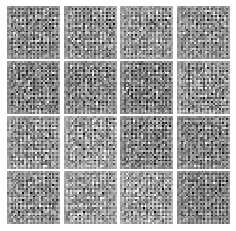

Epoch: 0, Iter: 20, D: 0.222, G:2.004


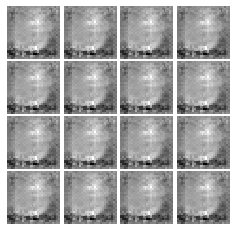

Epoch: 0, Iter: 40, D: 17.45, G:0.0002316


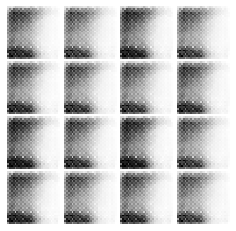

Epoch: 0, Iter: 60, D: 0.03102, G:3.687


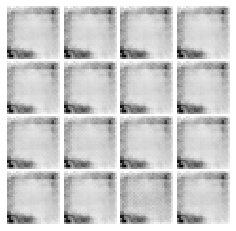

Epoch: 0, Iter: 80, D: 0.002914, G:6.007


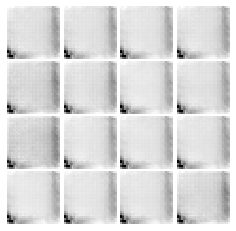

Epoch: 0, Iter: 100, D: 0.00132, G:6.745


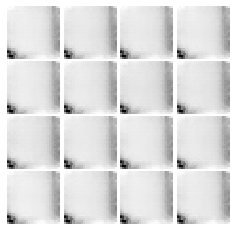

Epoch: 0, Iter: 120, D: 0.0006639, G:7.402


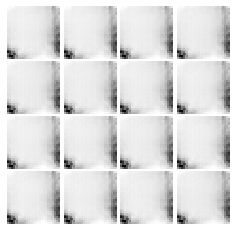

Epoch: 0, Iter: 140, D: 0.02462, G:5.102


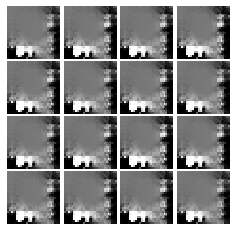

Epoch: 0, Iter: 160, D: 0.2751, G:2.481


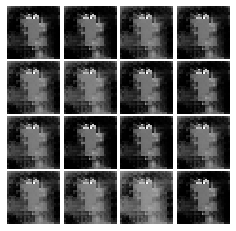

Epoch: 0, Iter: 180, D: 1.577, G:1.318


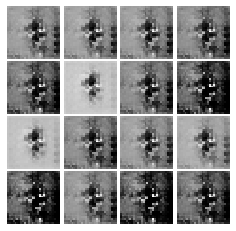

Epoch: 0, Iter: 200, D: 1.326, G:1.137


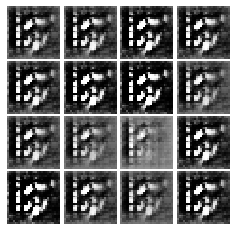

Epoch: 0, Iter: 220, D: 0.2815, G:2.106


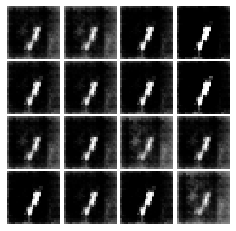

Epoch: 0, Iter: 240, D: 0.9488, G:1.499


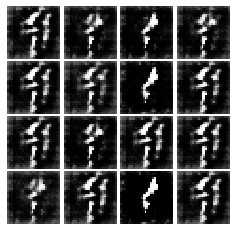

Epoch: 0, Iter: 260, D: 0.9393, G:1.622


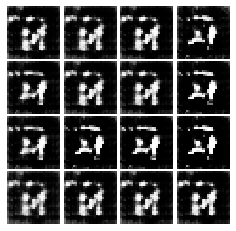

Epoch: 0, Iter: 280, D: 1.157, G:1.179


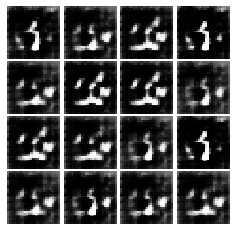

Epoch: 0, Iter: 300, D: 1.061, G:1.815


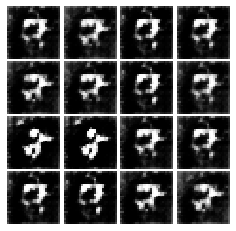

Epoch: 0, Iter: 320, D: 1.462, G:3.91


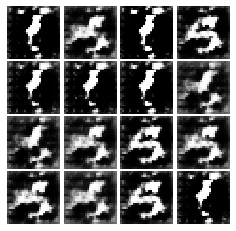

Epoch: 0, Iter: 340, D: 0.845, G:2.566


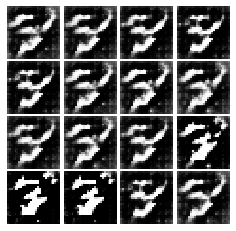

Epoch: 0, Iter: 360, D: 1.124, G:1.923


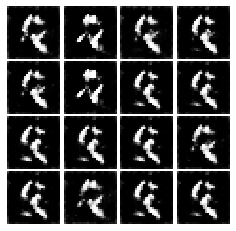

Epoch: 0, Iter: 380, D: 0.7263, G:2.492


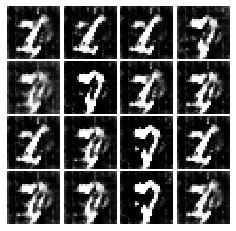

Epoch: 0, Iter: 400, D: 1.207, G:0.7889


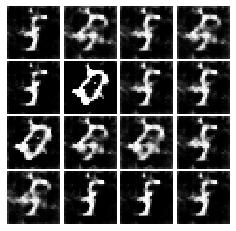

Epoch: 0, Iter: 420, D: 0.5244, G:2.34


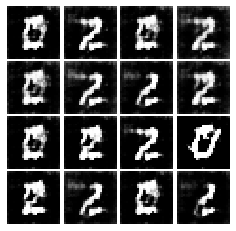

Epoch: 0, Iter: 440, D: 1.02, G:1.623


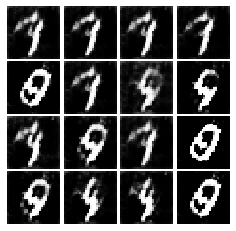

Epoch: 0, Iter: 460, D: 0.1696, G:3.34


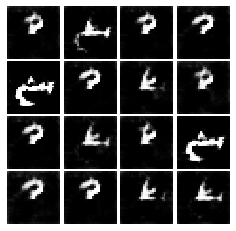

Epoch: 1, Iter: 480, D: 0.667, G:2.575


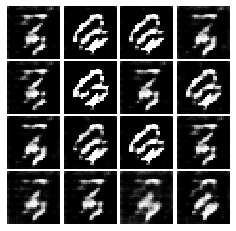

Epoch: 1, Iter: 500, D: 0.674, G:2.418


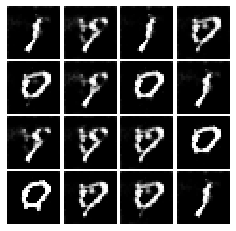

Epoch: 1, Iter: 520, D: 0.7975, G:1.997


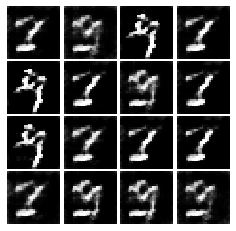

Epoch: 1, Iter: 540, D: 0.5877, G:2.62


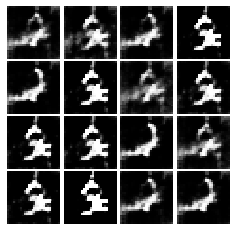

Epoch: 1, Iter: 560, D: 0.7787, G:2.679


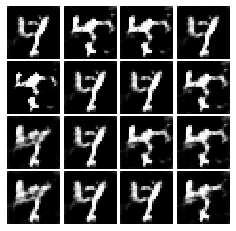

Epoch: 1, Iter: 580, D: 0.8264, G:1.717


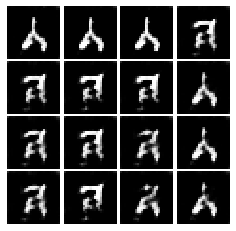

Epoch: 1, Iter: 600, D: 1.102, G:1.785


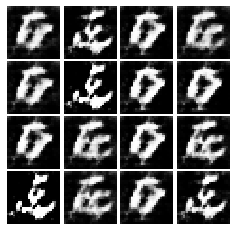

Epoch: 1, Iter: 620, D: 0.5307, G:2.259


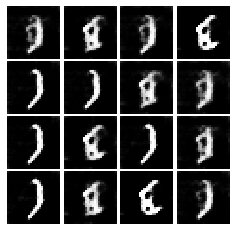

Epoch: 1, Iter: 640, D: 0.628, G:2.488


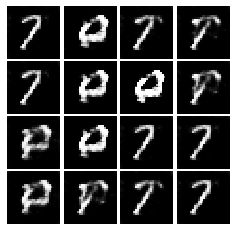

Epoch: 1, Iter: 660, D: 0.4854, G:2.535


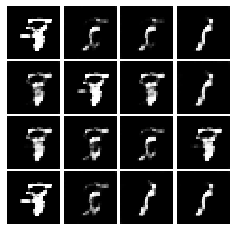

Epoch: 1, Iter: 680, D: 0.535, G:2.192


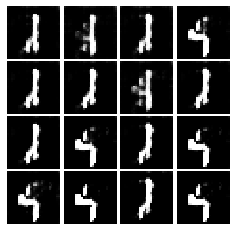

Epoch: 1, Iter: 700, D: 0.3194, G:3.852


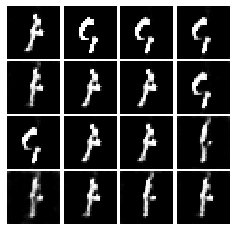

Epoch: 1, Iter: 720, D: 0.3744, G:3.732


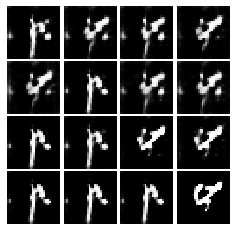

Epoch: 1, Iter: 740, D: 0.4448, G:3.381


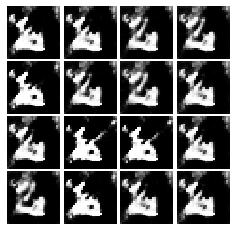

Epoch: 1, Iter: 760, D: 0.4907, G:2.631


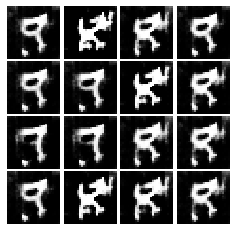

Epoch: 1, Iter: 780, D: 0.9214, G:4.404


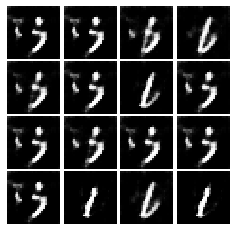

Epoch: 1, Iter: 800, D: 0.3232, G:2.681


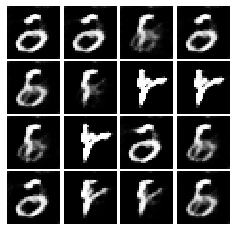

Epoch: 1, Iter: 820, D: 1.003, G:3.902


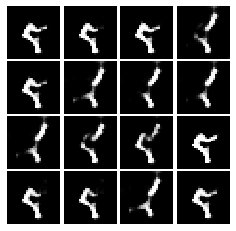

Epoch: 1, Iter: 840, D: 0.6596, G:1.984


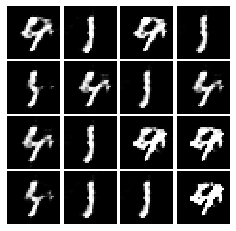

Epoch: 1, Iter: 860, D: 0.5327, G:2.574


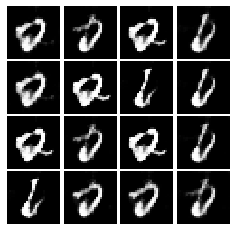

Epoch: 1, Iter: 880, D: 1.012, G:3.521


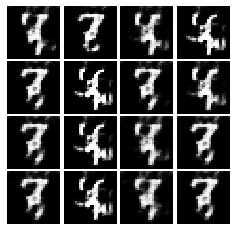

Epoch: 1, Iter: 900, D: 0.5423, G:1.888


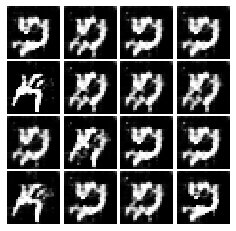

Epoch: 1, Iter: 920, D: 0.698, G:3.671


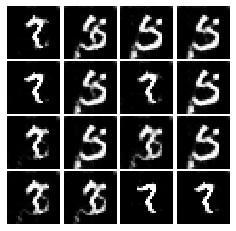

Epoch: 2, Iter: 940, D: 0.7783, G:3.625


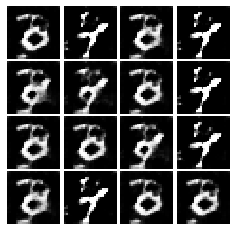

Epoch: 2, Iter: 960, D: 0.6024, G:3.899


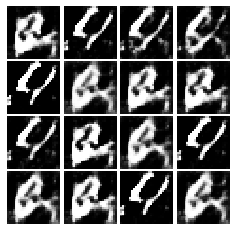

Epoch: 2, Iter: 980, D: 0.6668, G:2.651


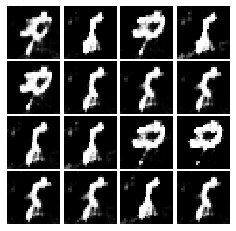

Epoch: 2, Iter: 1000, D: 0.4201, G:1.989


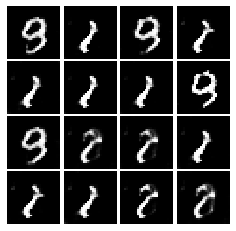

Epoch: 2, Iter: 1020, D: 0.386, G:2.394


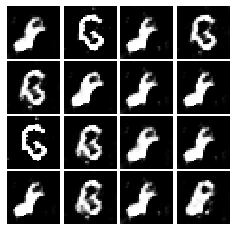

Epoch: 2, Iter: 1040, D: 4.27, G:4.496


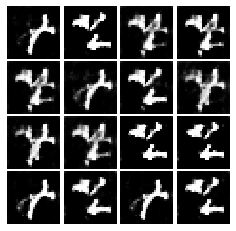

Epoch: 2, Iter: 1060, D: 1.914, G:3.617


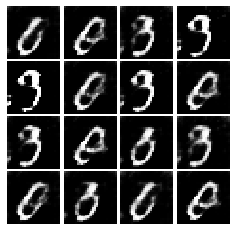

Epoch: 2, Iter: 1080, D: 0.6435, G:2.736


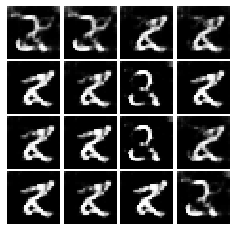

Epoch: 2, Iter: 1100, D: 0.9518, G:3.523


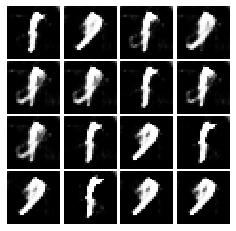

Epoch: 2, Iter: 1120, D: 0.4117, G:2.717


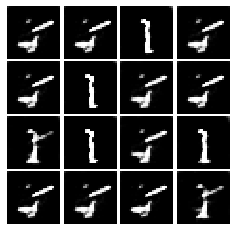

Epoch: 2, Iter: 1140, D: 0.3615, G:2.721


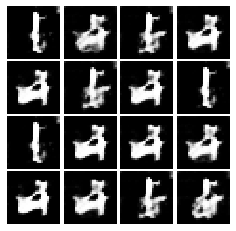

Epoch: 2, Iter: 1160, D: 0.2776, G:4.152


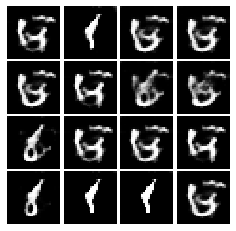

Epoch: 2, Iter: 1180, D: 0.3626, G:3.733


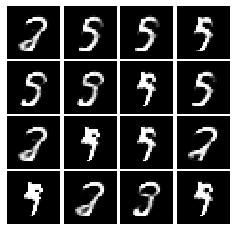

Epoch: 2, Iter: 1200, D: 0.9364, G:3.763


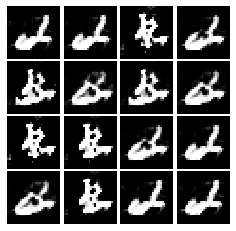

Epoch: 2, Iter: 1220, D: 0.9002, G:1.678


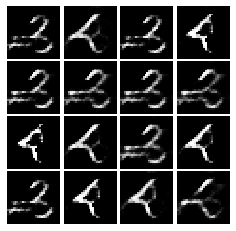

Epoch: 2, Iter: 1240, D: 0.1264, G:4.063


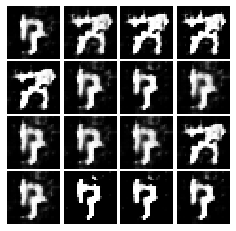

Epoch: 2, Iter: 1260, D: 0.8307, G:4.538


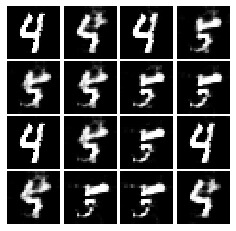

Epoch: 2, Iter: 1280, D: 0.6382, G:3.976


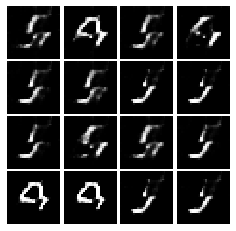

Epoch: 2, Iter: 1300, D: 0.3664, G:3.19


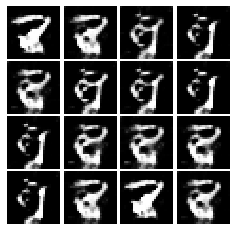

Epoch: 2, Iter: 1320, D: 0.6557, G:4.472


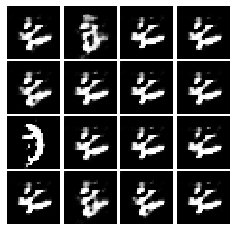

Epoch: 2, Iter: 1340, D: 0.5728, G:3.022


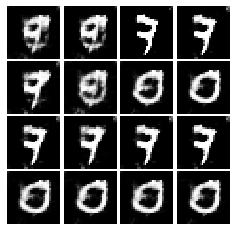

Epoch: 2, Iter: 1360, D: 0.2159, G:4.038


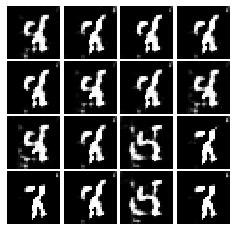

Epoch: 2, Iter: 1380, D: 0.4692, G:1.967


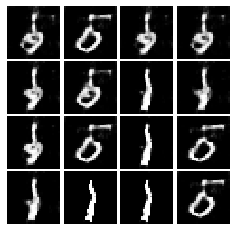

Epoch: 2, Iter: 1400, D: 0.2489, G:3.615


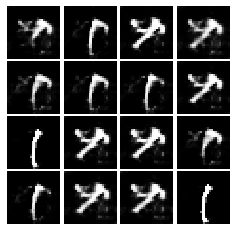

Epoch: 3, Iter: 1420, D: 0.8416, G:4.221


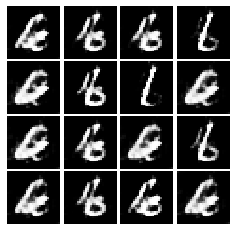

Epoch: 3, Iter: 1440, D: 0.3417, G:3.214


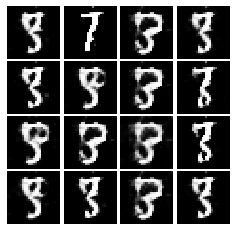

Epoch: 3, Iter: 1460, D: 0.6954, G:2.883


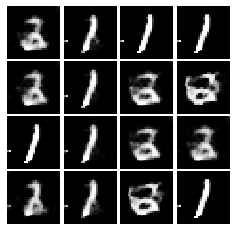

Epoch: 3, Iter: 1480, D: 0.5288, G:3.481


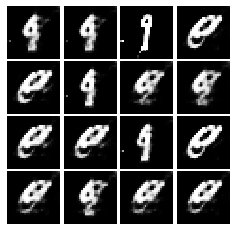

Epoch: 3, Iter: 1500, D: 0.2686, G:3.525


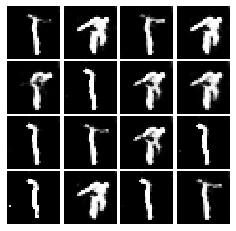

Epoch: 3, Iter: 1520, D: 0.1965, G:3.876


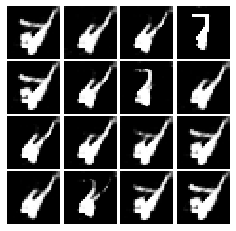

Epoch: 3, Iter: 1540, D: 0.3978, G:5.254


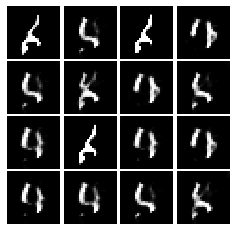

Epoch: 3, Iter: 1560, D: 0.2881, G:3.948


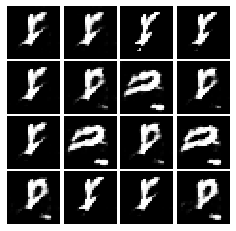

Epoch: 3, Iter: 1580, D: 0.2633, G:4.041


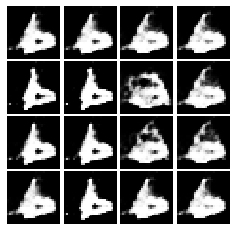

Epoch: 3, Iter: 1600, D: 0.7216, G:3.797


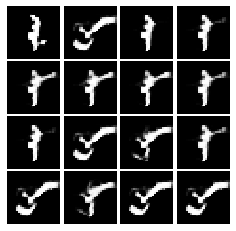

Epoch: 3, Iter: 1620, D: 0.2781, G:2.919


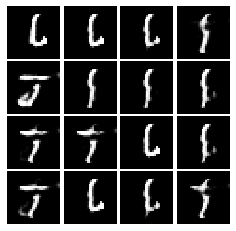

Epoch: 3, Iter: 1640, D: 0.1466, G:3.787


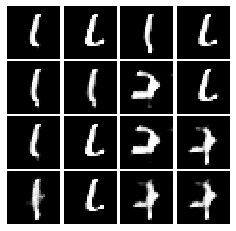

Epoch: 3, Iter: 1660, D: 0.4099, G:3.323


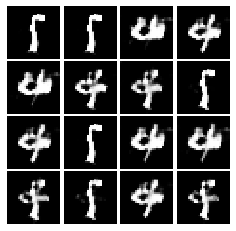

Epoch: 3, Iter: 1680, D: 1.036, G:2.148


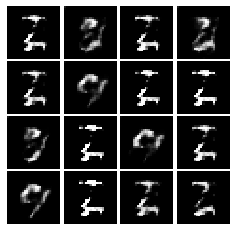

Epoch: 3, Iter: 1700, D: 0.2759, G:3.511


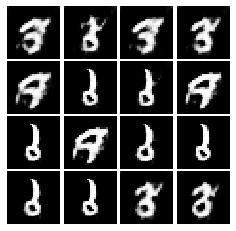

Epoch: 3, Iter: 1720, D: 0.148, G:3.56


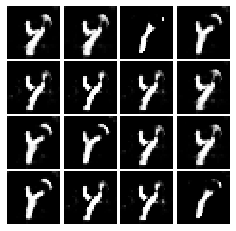

Epoch: 3, Iter: 1740, D: 0.5819, G:3.194


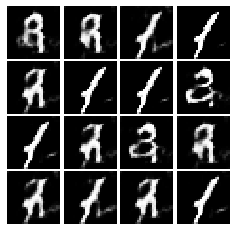

Epoch: 3, Iter: 1760, D: 0.1674, G:4.207


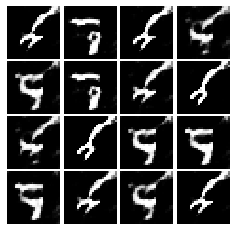

Epoch: 3, Iter: 1780, D: 0.1726, G:3.706


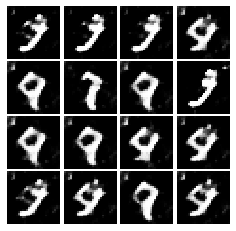

Epoch: 3, Iter: 1800, D: 0.8138, G:4.527


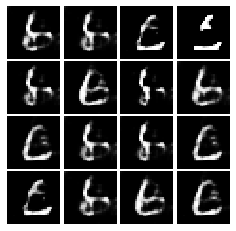

Epoch: 3, Iter: 1820, D: 0.3681, G:2.744


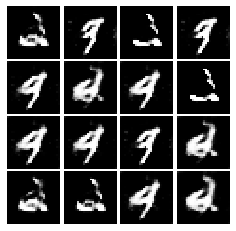

Epoch: 3, Iter: 1840, D: 0.4228, G:3.169


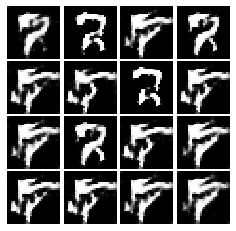

Epoch: 3, Iter: 1860, D: 0.7583, G:5.988


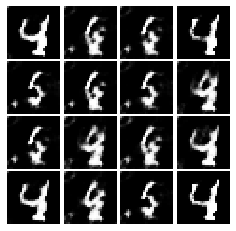

Epoch: 4, Iter: 1880, D: 0.496, G:3.735


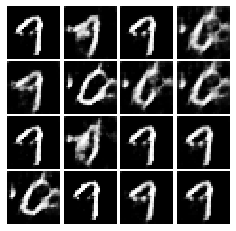

Epoch: 4, Iter: 1900, D: 0.2742, G:3.522


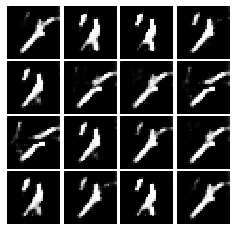

Epoch: 4, Iter: 1920, D: 1.469, G:12.37


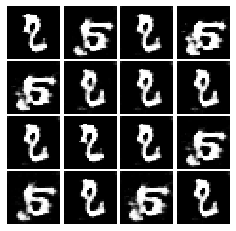

Epoch: 4, Iter: 1940, D: 0.4046, G:6.129


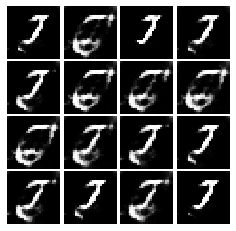

Epoch: 4, Iter: 1960, D: 0.5378, G:2.618


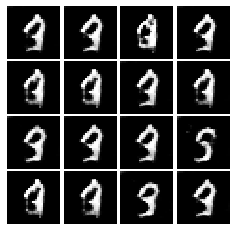

Epoch: 4, Iter: 1980, D: 0.192, G:4.756


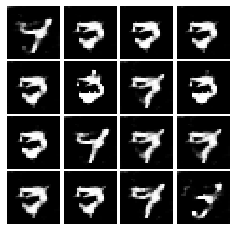

Epoch: 4, Iter: 2000, D: 0.4009, G:3.778


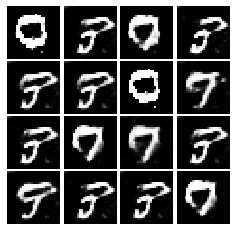

Epoch: 4, Iter: 2020, D: 0.4294, G:2.953


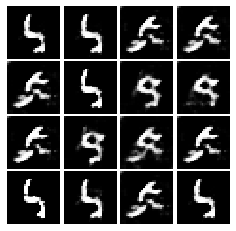

Epoch: 4, Iter: 2040, D: 0.3542, G:5.261


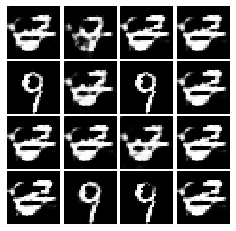

Epoch: 4, Iter: 2060, D: 0.6518, G:4.217


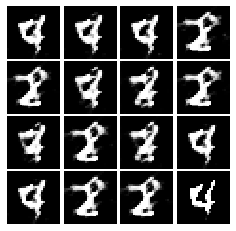

Epoch: 4, Iter: 2080, D: 0.3093, G:2.422


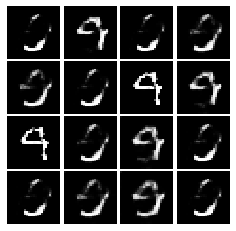

Epoch: 4, Iter: 2100, D: 0.1881, G:3.858


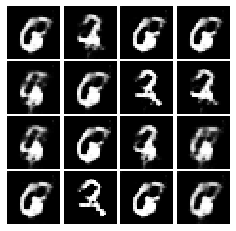

Epoch: 4, Iter: 2120, D: 0.1903, G:3.829


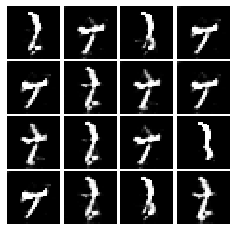

Epoch: 4, Iter: 2140, D: 0.478, G:3.477


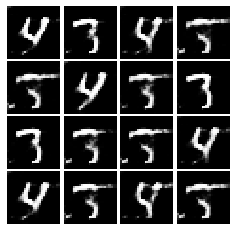

Epoch: 4, Iter: 2160, D: 0.2962, G:3.881


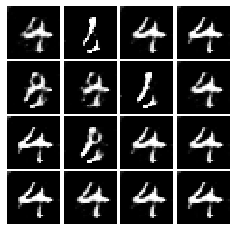

Epoch: 4, Iter: 2180, D: 0.2034, G:4.834


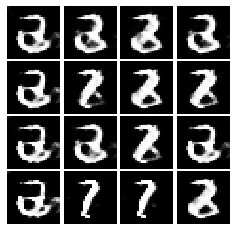

Epoch: 4, Iter: 2200, D: 0.2466, G:4.129


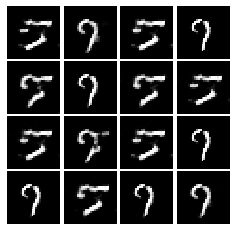

Epoch: 4, Iter: 2220, D: 0.07345, G:4.043


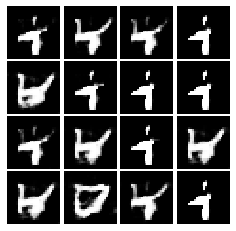

Epoch: 4, Iter: 2240, D: 0.2957, G:4.807


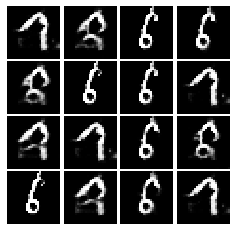

Epoch: 4, Iter: 2260, D: 0.1955, G:3.762


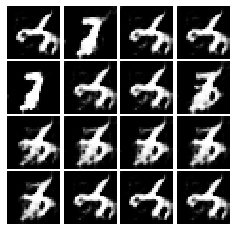

Epoch: 4, Iter: 2280, D: 0.2132, G:4.565


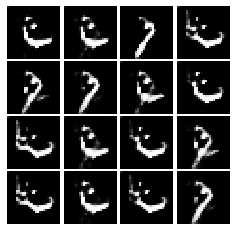

Epoch: 4, Iter: 2300, D: 0.2661, G:3.41


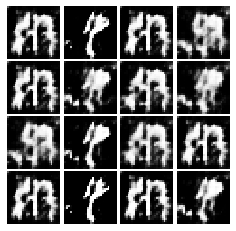

Epoch: 4, Iter: 2320, D: 0.3193, G:3.235


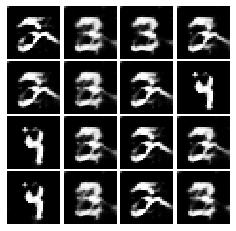

Epoch: 4, Iter: 2340, D: 0.5201, G:4.305


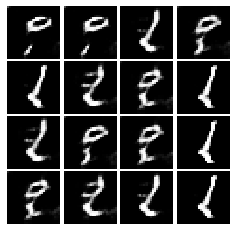

Final images


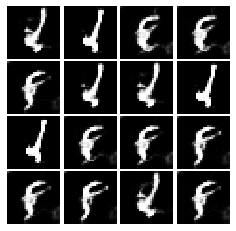

In [23]:
# Make the discriminator
D = discriminator()

# Make the generator
G = generator()

# Use the function you wrote earlier to get optimizers for the Discriminator and the Generator
D_solver, G_solver = get_solvers()

# Run it!
run_a_gan(D, G, D_solver, G_solver, discriminator_loss, generator_loss, num_epochs=5)

## INLINE QUESTION 1

We will look at an example to see why alternating minimization of the same objective (like in a GAN) can be tricky business.

Consider $f(x,y)=xy$. What does $\min_x\max_y f(x,y)$ evaluate to? (Hint: minmax tries to minimize the maximum value achievable.)

Now try to evaluate this function numerically for 6 steps, starting at the point $(1,1)$, 
by using alternating gradient (first updating y, then updating x using that updated y) with step size $1$. **Here step size is the learning_rate, and steps will be learning_rate * gradient.**
You'll find that writing out the update step in terms of $x_t,y_t,x_{t+1},y_{t+1}$ will be useful.

Breifly explain what $\min_x\max_y f(x,y)$ evaluates to and record the six pairs of explicit values for $(x_t,y_t)$ in the table below.

### Your answer:
 
 $y_0$ | $y_1$ | $y_2$ | $y_3$ | $y_4$ | $y_5$ | $y_6$ 
 ----- | ----- | ----- | ----- | ----- | ----- | ----- 
   1   |       |       |       |       |       |       
 $x_0$ | $x_1$ | $x_2$ | $x_3$ | $x_4$ | $x_5$ | $x_6$ 
   1   |       |       |       |       |       |       
   


## INLINE QUESTION 2
Using this method, will we ever reach the optimal value? Why or why not?

### Your answer: 


## INLINE QUESTION 3
If the generator loss decreases during training while the discriminator loss stays at a constant high value from the start, is this a good sign? Why or why not? A qualitative answer is sufficient.

### Your answer: 
